# Dataset 3: PAMAP2

# 3.0 Fuentes
La base de datos puede ser obtenida en el siguiente enlace: 
https://archive.ics.uci.edu/dataset/231/pamap2+physical+activity+monitoring


## 3.1. Cargar datos

In [1]:
import pandas as pd
import os

In [3]:
pd.set_option("display.float_format", "{:.3f}".format)

In [3]:
from abc import ABC, abstractmethod

class AbstractDataLoader(ABC):
    def __init__(self, src_path:str, keys:list, file_extension:str, delimiter:str):
        self.src_path = src_path
        self.keys = keys
        self.file_extension = file_extension
        self.delimiter = delimiter     
        
    @abstractmethod
    def load_data(self):
        pass

    @abstractmethod
    def _is_valid_extension(self, file):
        pass

In [4]:
class DataLoader(AbstractDataLoader):
    def __init__(self, src_path:str, keys:list, file_extension:str, delimiter:str):
        super().__init__(src_path, keys, file_extension, delimiter)
        
    
    def load_data(self):
        dataframes = []
        for file in os.listdir(self.src_path):
            if self._is_valid_extension(file):  
                df = pd.read_csv(os.path.join(self.src_path, file), delimiter=self.delimiter, names=self.keys)
                df['subject_id'] = self._get_subject_id(file)
                dataframes.append(df)
        final_df = pd.concat(dataframes, ignore_index=True)
        return final_df

                
    def _is_valid_extension(self, file):
        return file.endswith(self.file_extension)

    def _get_subject_id(self, file):
        return file.split('.')[0]

In [5]:
src = "dataset/PAMAP2_Dataset/Protocol/"
keys = [
    "timestamp",
    "activityID",
    "heart_rate_bpm",
    # IMU Hand (columns 4–20)
    "IMU_Hand_temperature",
    "IMU_Hand_acceleration_16g_x",
    "IMU_Hand_acceleration_16g_y",
    "IMU_Hand_acceleration_16g_z",
    "IMU_Hand_acceleration_6g_x",
    "IMU_Hand_acceleration_6g_y",
    "IMU_Hand_acceleration_6g_z",
    "IMU_Hand_gyroscope_x",
    "IMU_Hand_gyroscope_y",
    "IMU_Hand_gyroscope_z",
    "IMU_Hand_magnetometer_x",
    "IMU_Hand_magnetometer_y",
    "IMU_Hand_magnetometer_z",
    "IMU_Hand_orientation_1",
    "IMU_Hand_orientation_2",
    "IMU_Hand_orientation_3",
    "IMU_Hand_orientation_4",
    # IMU Chest (columns 21–37)
    "IMU_Chest_temperature",
    "IMU_Chest_acceleration_16g_x",
    "IMU_Chest_acceleration_16g_y",
    "IMU_Chest_acceleration_16g_z",
    "IMU_Chest_acceleration_6g_x",
    "IMU_Chest_acceleration_6g_y",
    "IMU_Chest_acceleration_6g_z",
    "IMU_Chest_gyroscope_x",
    "IMU_Chest_gyroscope_y",
    "IMU_Chest_gyroscope_z",
    "IMU_Chest_magnetometer_x",
    "IMU_Chest_magnetometer_y",
    "IMU_Chest_magnetometer_z",
    "IMU_Chest_orientation_1",
    "IMU_Chest_orientation_2",
    "IMU_Chest_orientation_3",
    "IMU_Chest_orientation_4",
    # IMU Ankle (columns 38–54)
    "IMU_Ankle_temperature",
    "IMU_Ankle_acceleration_16g_x",
    "IMU_Ankle_acceleration_16g_y",
    "IMU_Ankle_acceleration_16g_z",
    "IMU_Ankle_acceleration_6g_x",
    "IMU_Ankle_acceleration_6g_y",
    "IMU_Ankle_acceleration_6g_z",
    "IMU_Ankle_gyroscope_x",
    "IMU_Ankle_gyroscope_y",
    "IMU_Ankle_gyroscope_z",
    "IMU_Ankle_magnetometer_x",
    "IMU_Ankle_magnetometer_y",
    "IMU_Ankle_magnetometer_z",
    "IMU_Ankle_orientation_1",
    "IMU_Ankle_orientation_2",
    "IMU_Ankle_orientation_3",
    "IMU_Ankle_orientation_4"
]

file_extension = '.dat'
delimiter = r'\s+'
data_loader_pamap = DataLoader(src, keys, file_extension, delimiter)
pamap_data = data_loader_pamap.load_data()

pamap_data.shape

(2872533, 55)

## 2.2. Dimensiones y primeras 5 filas

In [8]:
pamap_data.shape

(2872533, 55)

Podemos observar que el dataset consta de:

1. **Características**: 55
2. **Ejemplos**: 2,872,533

In [9]:
pamap_data.head().T

,0,1,2,3,4
timestamp,5.890,5.900,5.910,5.920,5.930
activityID,0,0,0,0,0
heart_rate_bpm,NaN,NaN,NaN,NaN,NaN
IMU_Hand_temperature,32.688,32.688,32.688,32.688,32.688
IMU_Hand_acceleration_16g_x,-6.400,-6.402,-6.478,-6.327,-6.433
IMU_Hand_acceleration_16g_y,2.589,2.399,2.476,2.702,2.553
IMU_Hand_acceleration_16g_z,6.671,6.633,6.632,6.556,6.824
IMU_Hand_acceleration_6g_x,-6.264,-6.204,-6.233,-6.249,-6.233
IMU_Hand_acceleration_6g_y,2.576,2.545,2.605,2.621,2.605
IMU_Hand_acceleration_6g_z,6.986,6.941,6.986,6.895,6.971


## 2.3. Identifica y elimina los datos ausentes

### 2.3.1 Eliminación de atributos y registros irrelevantes

In [6]:
pamap_data = pamap_data[pamap_data['timestamp'] != 0 ]
pamap_data = pamap_data[pamap_data['subject_id'] != 9 ]
pamap_data = pamap_data[pamap_data['activityID'] != 0]

In [8]:
columns_redundant = [
    'IMU_Hand_acceleration_6g_x',
    'IMU_Hand_acceleration_6g_y',
    'IMU_Hand_acceleration_6g_z',
    'IMU_Chest_acceleration_6g_x',
    'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z',
    'IMU_Ankle_acceleration_6g_x',
    'IMU_Ankle_acceleration_6g_y',
    'IMU_Ankle_acceleration_6g_z',
    'IMU_Ankle_acceleration_6g_x',
    'IMU_Ankle_acceleration_6g_y',
    'IMU_Ankle_acceleration_6g_z',
    
    'IMU_Ankle_orientation_1',
    'IMU_Ankle_orientation_2',
    'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4',
    'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2',
    'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4',
    'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2',
    'IMU_Chest_orientation_3',
    'IMU_Chest_orientation_4',
    
    'heart_rate_bpm', 
    'IMU_Hand_temperature',
    'IMU_Chest_temperature',
    'IMU_Ankle_temperature'
]
pamap_data = pamap_data.drop(columns=columns_redundant, errors='ignore')
pamap_data.isnull().sum()

timestamp                           0
activityID                          0
IMU_Hand_acceleration_16g_x     11124
IMU_Hand_acceleration_16g_y     11124
IMU_Hand_acceleration_16g_z     11124
IMU_Hand_gyroscope_x            11124
IMU_Hand_gyroscope_y            11124
IMU_Hand_gyroscope_z            11124
IMU_Hand_magnetometer_x         11124
IMU_Hand_magnetometer_y         11124
IMU_Hand_magnetometer_z         11124
IMU_Chest_acceleration_16g_x     2420
IMU_Chest_acceleration_16g_y     2420
IMU_Chest_acceleration_16g_z     2420
IMU_Chest_gyroscope_x            2420
IMU_Chest_gyroscope_y            2420
IMU_Chest_gyroscope_z            2420
IMU_Chest_magnetometer_x         2420
IMU_Chest_magnetometer_y         2420
IMU_Chest_magnetometer_z         2420
IMU_Ankle_acceleration_16g_x     8507
IMU_Ankle_acceleration_16g_y     8507
IMU_Ankle_acceleration_16g_z     8507
IMU_Ankle_gyroscope_x            8507
IMU_Ankle_gyroscope_y            8507
IMU_Ankle_gyroscope_z            8507
IMU_Ankle_ma

In [52]:
pamap_data = pamap_data.dropna()
pamap_data.isnull().sum()

timestamp                       0
activityID                      0
IMU_Hand_acceleration_16g_x     0
IMU_Hand_acceleration_16g_y     0
IMU_Hand_acceleration_16g_z     0
IMU_Hand_gyroscope_x            0
IMU_Hand_gyroscope_y            0
IMU_Hand_gyroscope_z            0
IMU_Hand_magnetometer_x         0
IMU_Hand_magnetometer_y         0
IMU_Hand_magnetometer_z         0
IMU_Chest_acceleration_16g_x    0
IMU_Chest_acceleration_16g_y    0
IMU_Chest_acceleration_16g_z    0
IMU_Chest_gyroscope_x           0
IMU_Chest_gyroscope_y           0
IMU_Chest_gyroscope_z           0
IMU_Chest_magnetometer_x        0
IMU_Chest_magnetometer_y        0
IMU_Chest_magnetometer_z        0
IMU_Ankle_acceleration_16g_x    0
IMU_Ankle_acceleration_16g_y    0
IMU_Ankle_acceleration_16g_z    0
IMU_Ankle_gyroscope_x           0
IMU_Ankle_gyroscope_y           0
IMU_Ankle_gyroscope_z           0
IMU_Ankle_magnetometer_x        0
IMU_Ankle_magnetometer_y        0
IMU_Ankle_magnetometer_z        0
subject_id    

### 2.3.2 Tratamiento de datos ausentes (Deprecated)

In [40]:
pamap_data.isnull().sum()

activityID                          0
IMU_Hand_acceleration_16g_x     11124
IMU_Hand_acceleration_16g_y     11124
IMU_Hand_acceleration_16g_z     11124
IMU_Hand_gyroscope_x            11124
IMU_Hand_gyroscope_y            11124
IMU_Hand_gyroscope_z            11124
IMU_Hand_magnetometer_x         11124
IMU_Hand_magnetometer_y         11124
IMU_Hand_magnetometer_z         11124
IMU_Chest_acceleration_16g_x     2420
IMU_Chest_acceleration_16g_y     2420
IMU_Chest_acceleration_16g_z     2420
IMU_Chest_gyroscope_x            2420
IMU_Chest_gyroscope_y            2420
IMU_Chest_gyroscope_z            2420
IMU_Chest_magnetometer_x         2420
IMU_Chest_magnetometer_y         2420
IMU_Chest_magnetometer_z         2420
IMU_Ankle_acceleration_16g_x     8507
IMU_Ankle_acceleration_16g_y     8507
IMU_Ankle_acceleration_16g_z     8507
IMU_Ankle_gyroscope_x            8507
IMU_Ankle_gyroscope_y            8507
IMU_Ankle_gyroscope_z            8507
IMU_Ankle_magnetometer_x         8507
IMU_Ankle_ma

In [43]:
pamap_data.isna().sum().sum()

np.int64(198459)

Vemos que la cantidad de valores faltantes varía, pero no de sensor a sensor, sino que hay grupos de sensores que tienen la misma cantidad de faltantes. Vemos que depende de la posicíon del cuerpo en la cual esté el sensor:

- **Heart rate**: 2,610,265
- **Mano**: 13,141
- **Pecho**: 3,563
- **Tobillo**: 11,749

<BarContainer object of 4 artists>

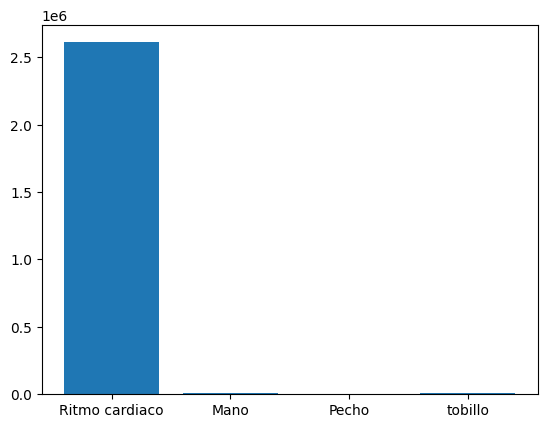

In [9]:
import matplotlib.pyplot as plt

# Datos
x = ["Ritmo cardiaco", "Mano", "Pecho", "tobillo"]
y = [2610265, 13141, 3563, 11749]

# Gráfico de barras
fig, ax = plt.subplots()
ax.bar(x = x, height = y)
# plt.show() 

Esto significa que tenemos muchos más valores faltantes en el monitor de ritmo cardíaco que en los demás, puesto que en este tenemos millones de vacíos. Mientras que en las manos y tobillo solo tenemos decenas de miles, y en el pecho solo unos cuantos miles. 

Si la proporción de valores faltantes en el heart rate monitor es demasiado alta, podríamos tener que eliminar la característica porque, si los reemplazamos, terminaremos muchas veces con el mismo valor (e.g. la media)

In [7]:
import pandas as pd

clases = ["Ritmo cardiaco", "Mano", "Pecho", "tobillo"]
faltantes = [2610265, 13141, 3563, 11749]
total = 2872533

ratios = [cantidad / total for cantidad in faltantes]
porcentajes = [ratio * 100 for ratio in ratios]

porcentaje_faltantes_por_clase = pd.DataFrame({
    'clase': clases,
    'cantidad de faltantes': faltantes,
    'ratio de faltantes': ratios,
    'porcentaje de faltantes': porcentajes
})

porcentaje_faltantes_por_clase

,clase,cantidad de faltantes,ratio de faltantes,porcentaje de faltantes
0,Ritmo cardiaco,2610265,0.909,90.870
1,Mano,13141,0.005,0.457
2,Pecho,3563,0.001,0.124
3,tobillo,11749,0.004,0.409


Podemos observar que 90% de los valores de ritmo cardíaco están vacíos, mentras que para la mano, el pecho y el tobillo, menos de un 1% de los valores son vacíos. Esto indica que, es posible, que un error haya ocurrido con el monitor de ritmo cardíaco o que la frecuencia de muestreo sea mucho menor. 

Si la frecuencia de muestro es menor, podríamos aplicar técnicas como el **forward propagation** o **interpolation**.

### 2.3.1. Heart rate monitor (Deprecated)

Para determinar esto, nos vamos a la documentación. 

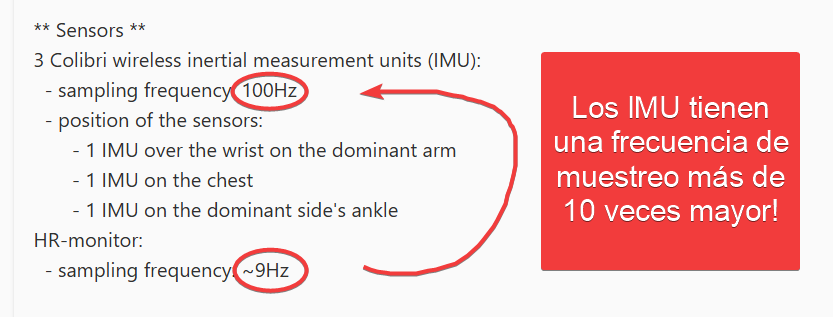


En ella notamos que el heart rate monitor tiene una frecuencia de muestreo de tan solo 9htz, mientras que los IMU tienen una de 100htz. Esto explica la razón detrás de que haya tantos valores faltantes: está tomando 10 veces menos mediciones. Esto es interesante porque significa que podríamos aplicar una de las técnicas mencionadas anteriormente (e.g. fill forward o interpolation), en lugar de eliminar la columna entera.

### 2.3.2. Linear interpolation (Deprecated)

In [9]:
deep_copy_pamap = pamap_data.copy().infer_objects()

# Seleccionamos las columnas numéricas que se pueden interpolar, excluyendo 'subject_id'
cols_to_interpolate = deep_copy_pamap.select_dtypes(include="number").columns.drop("subject_id", errors="ignore")

# Aplicamos la interpolación lineal para cada columna numérica por grupo
for col in cols_to_interpolate:
    deep_copy_pamap[col] = deep_copy_pamap.groupby("subject_id")[col].transform(
        lambda x: x.interpolate(method='linear', limit_direction='both')
    )

pamap_data = deep_copy_pamap.copy()
pamap_data.shape

(1942872, 30)

In [10]:
pamap_data.isnull().sum()

timestamp                       0
activityID                      0
IMU_Hand_acceleration_16g_x     0
IMU_Hand_acceleration_16g_y     0
IMU_Hand_acceleration_16g_z     0
IMU_Hand_gyroscope_x            0
IMU_Hand_gyroscope_y            0
IMU_Hand_gyroscope_z            0
IMU_Hand_magnetometer_x         0
IMU_Hand_magnetometer_y         0
IMU_Hand_magnetometer_z         0
IMU_Chest_acceleration_16g_x    0
IMU_Chest_acceleration_16g_y    0
IMU_Chest_acceleration_16g_z    0
IMU_Chest_gyroscope_x           0
IMU_Chest_gyroscope_y           0
IMU_Chest_gyroscope_z           0
IMU_Chest_magnetometer_x        0
IMU_Chest_magnetometer_y        0
IMU_Chest_magnetometer_z        0
IMU_Ankle_acceleration_16g_x    0
IMU_Ankle_acceleration_16g_y    0
IMU_Ankle_acceleration_16g_z    0
IMU_Ankle_gyroscope_x           0
IMU_Ankle_gyroscope_y           0
IMU_Ankle_gyroscope_z           0
IMU_Ankle_magnetometer_x        0
IMU_Ankle_magnetometer_y        0
IMU_Ankle_magnetometer_z        0
subject_id    

## 2.4. Tipos de datos de cada atributo

In [10]:
pamap_data.dtypes

timestamp                       float64
activityID                        int64
heart_rate_bpm                  float64
IMU_Hand_temperature            float64
IMU_Hand_acceleration_16g_x     float64
IMU_Hand_acceleration_16g_y     float64
IMU_Hand_acceleration_16g_z     float64
IMU_Hand_acceleration_6g_x      float64
IMU_Hand_acceleration_6g_y      float64
IMU_Hand_acceleration_6g_z      float64
IMU_Hand_gyroscope_x            float64
IMU_Hand_gyroscope_y            float64
IMU_Hand_gyroscope_z            float64
IMU_Hand_magnetometer_x         float64
IMU_Hand_magnetometer_y         float64
IMU_Hand_magnetometer_z         float64
IMU_Hand_orientation_1          float64
IMU_Hand_orientation_2          float64
IMU_Hand_orientation_3          float64
IMU_Hand_orientation_4          float64
IMU_Chest_temperature           float64
IMU_Chest_acceleration_16g_x    float64
IMU_Chest_acceleration_16g_y    float64
IMU_Chest_acceleration_16g_z    float64
IMU_Chest_acceleration_6g_x     float64


Observamos que todas las características son de tipo flotante excepto de "subject_id", la cual es una string y que en pandas se representa con el tipo object, y el "activityID" que es un entero.

## 2.5. Resumen estadístico

In [13]:
import matplotlib.pyplot as plt
stats = pamap_data.describe().T
fig, ax = plt.subplots(figsize=(12, len(stats)*0.4))  # Ajusta tamaño si hay muchas filas
ax.axis('off')
table = ax.table(cellText=stats.round(2).values,
                 colLabels=stats.columns,
                 rowLabels=stats.index,
                 loc='center',
                 cellLoc='center')

# Opcional: estilizar
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 1.5)

# Guardar como imagen
plt.savefig('resumen_estadistico.png', bbox_inches='tight', dpi=300)
plt.close()

## 2.6. Distribución de clases

En el siguiente análisis se eliminaron del dataset aquellos registros con una clase de actividad de valor cero, debido a que esta clase solamente representa el cambio de una actividad a otra. 

In [11]:
pamap_data = pamap_data[pamap_data['activityID'] != 0]

In [10]:
pamap_data.columns

Index(['timestamp', 'activityID', 'heart_rate_bpm', 'IMU_Hand_temperature',
       'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
       'IMU_Hand_acceleration_16g_z', 'IMU_Hand_acceleration_6g_x',
       'IMU_Hand_acceleration_6g_y', 'IMU_Hand_acceleration_6g_z',
       'IMU_Hand_gyroscope_x', 'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
       'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
       'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
       'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
       'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
       'IMU_Chest_acceleration_16g_x', 'IMU_Chest_acceleration_16g_y',
       'IMU_Chest_acceleration_16g_z', 'IMU_Chest_acceleration_6g_x',
       'IMU_Chest_acceleration_6g_y', 'IMU_Chest_acceleration_6g_z',
       'IMU_Chest_gyroscope_x', 'IMU_Chest_gyroscope_y',
       'IMU_Chest_gyroscope_z', 'IMU_Chest_magnetometer_x',
       'IMU_Chest_magnetometer_y', 'IMU_Chest_magnetometer_z',
       'IMU_C

In [12]:
class_distribution_pamap = pamap_data['activityID'].value_counts()
class_distribution_pamap

activityID
4     238761
17    238690
1     192523
3     189931
7     188107
2     185188
16    175353
6     164600
12    117216
13    104944
5      98199
24     49360
Name: count, dtype: int64

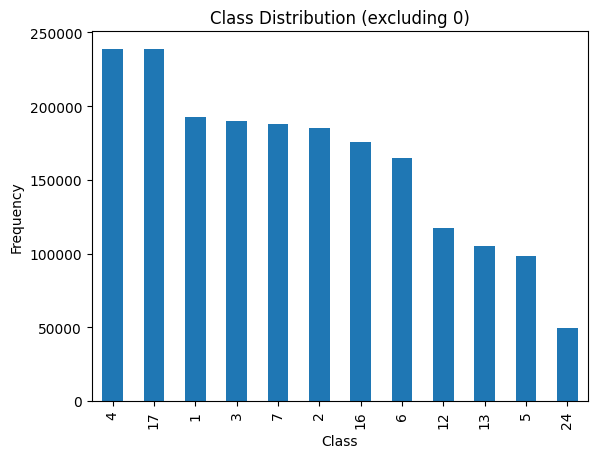

In [13]:
import matplotlib.pyplot as plt
class_distribution_pamap.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.title('Class Distribution (excluding 0)')
plt.show()

Notamos un imbalance de clases en donde la clase menor es la clase 24. Tiene casi 4 veces menos que la clase 4. Por esto tenemos que usar métricas como Macro Average para ver la clasificación general y F1-score para la clasificación por nivel.

## 2.7. Correlación entre atributos

In [17]:
import pandas as pd
# Eliminar las columnas 'activityID' y 'timestamp' si existen
pamap_filtered = pamap_data.drop(columns=['activityID', 'timestamp'], errors='ignore')

# Seleccionar solo las columnas numéricas restantes
pamap_numeric = pamap_filtered.select_dtypes(include=['number'])

# Calcular la matriz de correlación utilizando el método de Spearman
pamap_corr_matrix = pamap_numeric.corr(method='pearson')

# Mostrar la matriz de correlación
pamap_corr_matrix


,heart_rate_bpm,IMU_Hand_temperature,IMU_Hand_acceleration_16g_x,IMU_Hand_acceleration_16g_y,IMU_Hand_acceleration_16g_z,IMU_Hand_acceleration_6g_x,IMU_Hand_acceleration_6g_y,IMU_Hand_acceleration_6g_z,IMU_Hand_gyroscope_x,IMU_Hand_gyroscope_y,...,IMU_Ankle_gyroscope_x,IMU_Ankle_gyroscope_y,IMU_Ankle_gyroscope_z,IMU_Ankle_magnetometer_x,IMU_Ankle_magnetometer_y,IMU_Ankle_magnetometer_z,IMU_Ankle_orientation_1,IMU_Ankle_orientation_2,IMU_Ankle_orientation_3,IMU_Ankle_orientation_4
heart_rate_bpm,1.000,-0.394,-0.304,0.061,-0.269,-0.313,0.060,-0.278,0.013,0.064,...,0.002,-0.025,0.007,-0.325,-0.247,-0.057,0.368,-0.006,0.034,0.150
IMU_Hand_temperature,-0.394,1.000,0.059,-0.052,0.076,0.074,-0.047,0.093,-0.025,-0.025,...,0.001,0.030,0.003,0.091,0.113,0.155,-0.140,0.072,-0.050,0.072
IMU_Hand_acceleration_16g_x,-0.304,0.059,1.000,-0.085,0.259,0.979,-0.080,0.263,0.020,-0.093,...,0.038,-0.072,0.093,0.085,0.209,-0.043,-0.073,0.041,-0.015,-0.124
IMU_Hand_acceleration_16g_y,0.061,-0.052,-0.085,1.000,-0.066,-0.070,0.945,-0.069,0.181,-0.008,...,-0.005,-0.031,-0.037,-0.049,-0.096,0.041,0.063,-0.042,-0.083,-0.017
IMU_Hand_acceleration_16g_z,-0.269,0.076,0.259,-0.066,1.000,0.256,-0.066,0.964,-0.027,-0.025,...,0.013,-0.013,0.025,0.060,0.108,-0.012,-0.070,0.058,-0.036,-0.045
IMU_Hand_acceleration_6g_x,-0.313,0.074,0.979,-0.070,0.256,1.000,-0.076,0.260,0.026,-0.070,...,0.039,-0.071,0.082,0.086,0.215,-0.040,-0.076,0.043,-0.013,-0.123
IMU_Hand_acceleration_6g_y,0.060,-0.047,-0.080,0.945,-0.066,-0.076,1.000,-0.056,0.126,-0.018,...,-0.003,-0.032,-0.014,-0.052,-0.099,0.044,0.067,-0.043,-0.087,-0.017
IMU_Hand_acceleration_6g_z,-0.278,0.093,0.263,-0.069,0.964,0.260,-0.056,1.000,-0.017,-0.048,...,0.013,-0.013,0.027,0.061,0.113,-0.009,-0.074,0.060,-0.036,-0.045
IMU_Hand_gyroscope_x,0.013,-0.025,0.020,0.181,-0.027,0.026,0.126,-0.017,1.000,-0.221,...,0.026,-0.034,0.134,0.013,-0.066,-0.001,0.007,-0.031,-0.023,-0.012
IMU_Hand_gyroscope_y,0.064,-0.025,-0.093,-0.008,-0.025,-0.070,-0.018,-0.048,-0.221,1.000,...,0.050,0.097,-0.034,-0.008,-0.003,-0.015,0.012,0.011,-0.012,0.013


In [16]:
pamap_data.columns

Index(['timestamp', 'activityID', 'heart_rate_bpm', 'IMU_Hand_temperature',
       'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
       'IMU_Hand_acceleration_16g_z', 'IMU_Hand_acceleration_6g_x',
       'IMU_Hand_acceleration_6g_y', 'IMU_Hand_acceleration_6g_z',
       'IMU_Hand_gyroscope_x', 'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
       'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
       'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
       'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
       'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
       'IMU_Chest_acceleration_16g_x', 'IMU_Chest_acceleration_16g_y',
       'IMU_Chest_acceleration_16g_z', 'IMU_Chest_acceleration_6g_x',
       'IMU_Chest_acceleration_6g_y', 'IMU_Chest_acceleration_6g_z',
       'IMU_Chest_gyroscope_x', 'IMU_Chest_gyroscope_y',
       'IMU_Chest_gyroscope_z', 'IMU_Chest_magnetometer_x',
       'IMU_Chest_magnetometer_y', 'IMU_Chest_magnetometer_z',
       'IMU_C

## Matriz de coorelación

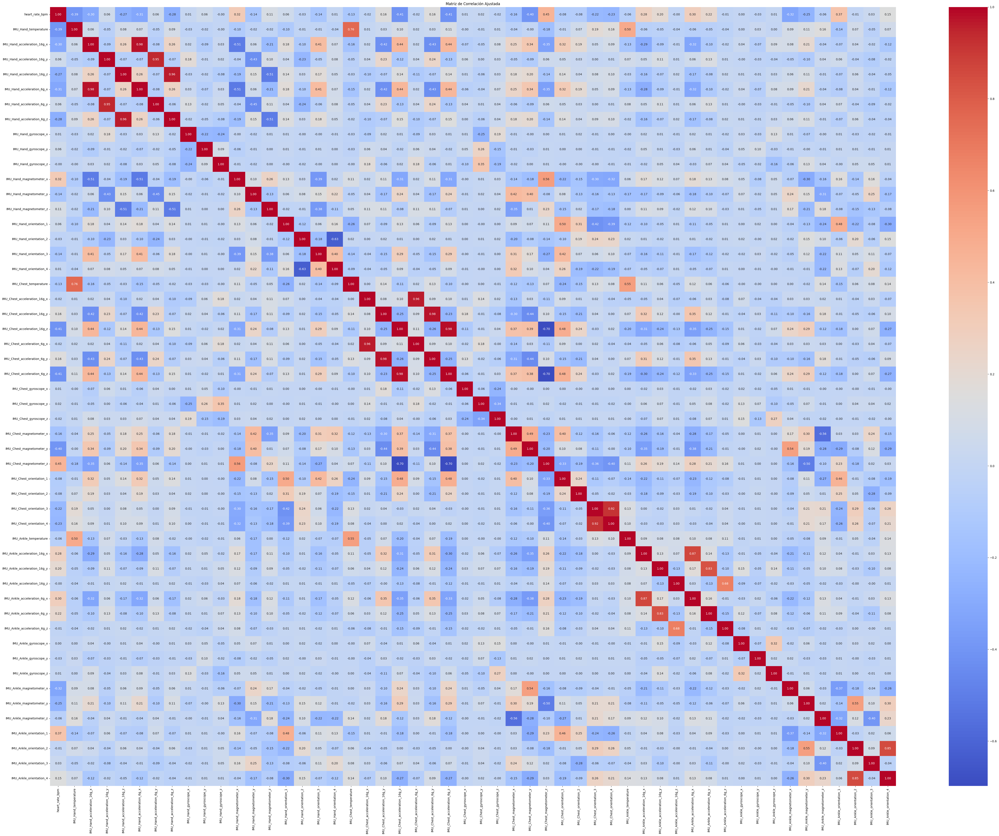

In [26]:
cols = pamap_corr_matrix.shape[1]
figsize = (cols, cols * 0.75)

plt.figure(figsize=figsize)
sns.heatmap(
    pamap_corr_matrix, 
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    annot_kws={"size": 10}
)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.title('Matriz de Correlación Ajustada', fontsize=12)
plt.savefig("matriz_correlacion_pamap.png", dpi=300, bbox_inches='tight')
plt.show()

## Tabla de correlación en formato de imagen

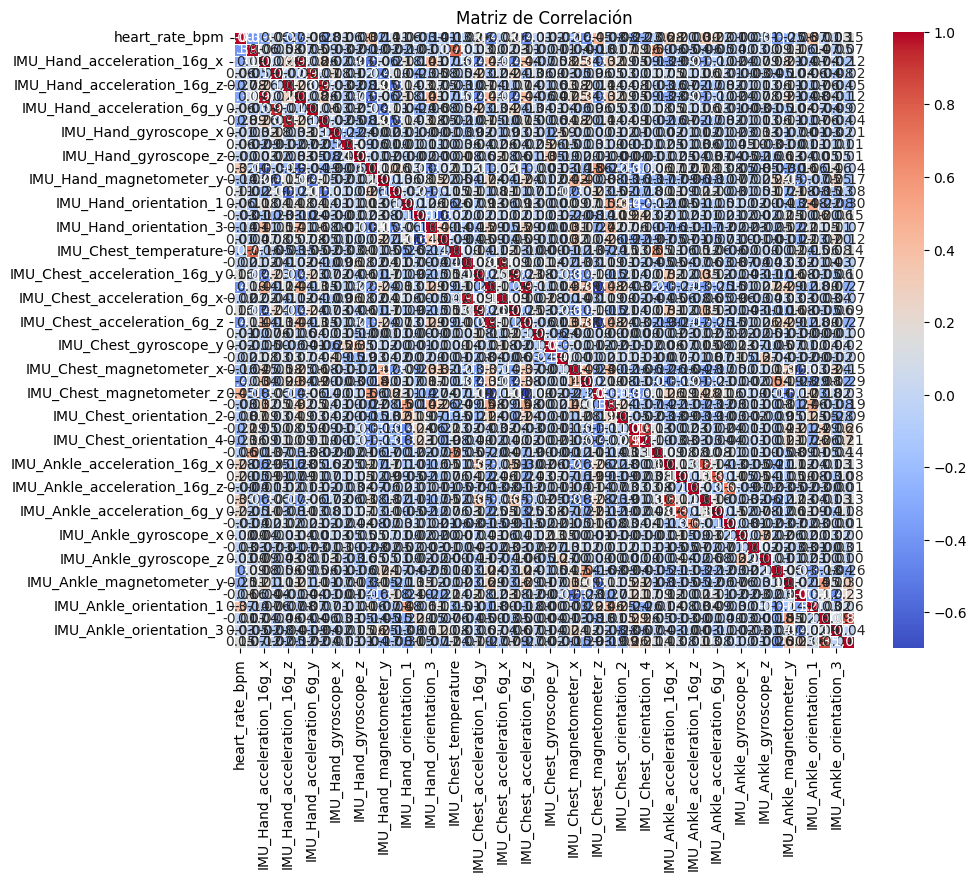

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Supongamos que pamap_data ya está definido, sino se debe cargar un DataFrame de ejemplo.

# Eliminar las columnas 'activityID' y 'timestamp' si existen
pamap_filtered = pamap_data.drop(columns=['activityID', 'timestamp'], errors='ignore')

# Seleccionar solo las columnas numéricas restantes
pamap_numeric = pamap_filtered.select_dtypes(include=['number'])

# Calcular la matriz de correlación utilizando el método de Spearman
pamap_corr_matrix = pamap_numeric.corr(method='pearson')

# Crear una imagen de la matriz de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(pamap_corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación')
plt.show()

## Valores con alta correlación

In [27]:
import numpy as np
threshold = 0.8
mask = np.abs(pamap_corr_matrix) > threshold

np.fill_diagonal(mask.values, False)

high_corr_pairs = [
    (col1, col2, pamap_corr_matrix.loc[col1, col2])
    for col1 in pamap_corr_matrix.columns
    for col2 in pamap_corr_matrix.columns
    if mask.loc[col1, col2]
]

# Mostrar los pares
for pair in high_corr_pairs:
    print(f"{pair[0]} - {pair[1]}: {pair[2]}")

IMU_Hand_acceleration_16g_x - IMU_Hand_acceleration_6g_x: 0.9785998110327653
IMU_Hand_acceleration_16g_y - IMU_Hand_acceleration_6g_y: 0.945085601545487
IMU_Hand_acceleration_16g_z - IMU_Hand_acceleration_6g_z: 0.9644747695346781
IMU_Hand_acceleration_6g_x - IMU_Hand_acceleration_16g_x: 0.9785998110327653
IMU_Hand_acceleration_6g_y - IMU_Hand_acceleration_16g_y: 0.945085601545487
IMU_Hand_acceleration_6g_z - IMU_Hand_acceleration_16g_z: 0.9644747695346781
IMU_Chest_acceleration_16g_x - IMU_Chest_acceleration_6g_x: 0.9633232160719609
IMU_Chest_acceleration_16g_y - IMU_Chest_acceleration_6g_y: 0.9766406333878105
IMU_Chest_acceleration_16g_z - IMU_Chest_acceleration_6g_z: 0.9846647002901248
IMU_Chest_acceleration_6g_x - IMU_Chest_acceleration_16g_x: 0.9633232160719609
IMU_Chest_acceleration_6g_y - IMU_Chest_acceleration_16g_y: 0.9766406333878105
IMU_Chest_acceleration_6g_z - IMU_Chest_acceleration_16g_z: 0.9846647002901248
IMU_Chest_orientation_3 - IMU_Chest_orientation_4: 0.9191990377091

Notamos que existen pares con los cuales presentan una alta correlación, siendo con un valor mayor a 8 según la prueba de pearson. Según el trabajo de Rehaman (2024), los atributos de aceleración de 6g son eliminados por ser redundantes. Por otra parte, el trabajo de Baldominos (2017) menciona que los registros relacionados con la orientación, son eliminados por ser invalidos. Por lo que pasamos a descartarlos del dataset. 

In [12]:
columns_redundant = [
    'IMU_Hand_acceleration_6g_x',
    'IMU_Hand_acceleration_6g_y',
    'IMU_Hand_acceleration_6g_z',
    'IMU_Chest_acceleration_6g_x',
    'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z',
    'IMU_Ankle_acceleration_6g_x',
    'IMU_Ankle_acceleration_6g_y',
    'IMU_Ankle_acceleration_6g_z',
    'IMU_Ankle_acceleration_6g_x',
    'IMU_Ankle_acceleration_6g_y',
    'IMU_Ankle_acceleration_6g_z',
    'IMU_Ankle_orientation_1',
    'IMU_Ankle_orientation_2',
    'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4',
    'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2',
    'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4',
    'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2',
    'IMU_Chest_orientation_3',
    'IMU_Chest_orientation_4',
    'heart_rate_bpm', 
    'IMU_Hand_temperature',
    'IMU_Chest_temperature',
    'IMU_Ankle_temperature'
]
pamap_data = pamap_data.drop(columns=columns_redundant, errors='ignore')
pamap_data.columns

Index(['timestamp', 'activityID', 'IMU_Hand_acceleration_16g_x',
       'IMU_Hand_acceleration_16g_y', 'IMU_Hand_acceleration_16g_z',
       'IMU_Hand_gyroscope_x', 'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
       'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
       'IMU_Hand_magnetometer_z', 'IMU_Chest_acceleration_16g_x',
       'IMU_Chest_acceleration_16g_y', 'IMU_Chest_acceleration_16g_z',
       'IMU_Chest_gyroscope_x', 'IMU_Chest_gyroscope_y',
       'IMU_Chest_gyroscope_z', 'IMU_Chest_magnetometer_x',
       'IMU_Chest_magnetometer_y', 'IMU_Chest_magnetometer_z',
       'IMU_Ankle_acceleration_16g_x', 'IMU_Ankle_acceleration_16g_y',
       'IMU_Ankle_acceleration_16g_z', 'IMU_Ankle_gyroscope_x',
       'IMU_Ankle_gyroscope_y', 'IMU_Ankle_gyroscope_z',
       'IMU_Ankle_magnetometer_x', 'IMU_Ankle_magnetometer_y',
       'IMU_Ankle_magnetometer_z', 'subject_id'],
      dtype='object')

### Distribución de actividades sin los atributos correlacionados

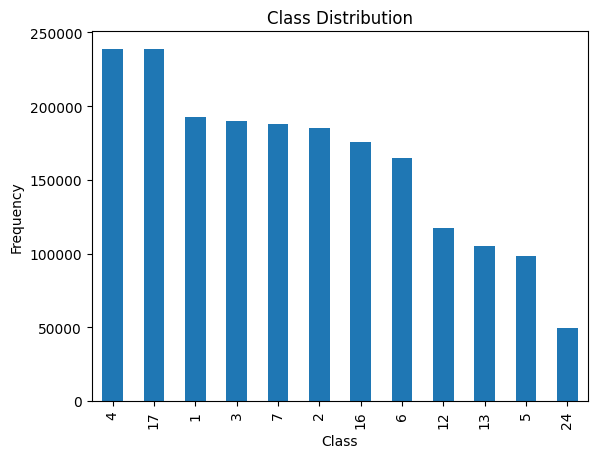

In [13]:
import matplotlib.pyplot as plt
class_distribution_pamap = pamap_data['activityID'].value_counts()
class_distribution_pamap
class_distribution_pamap.plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.title('Class Distribution')
plt.show()

## 2.8. Histograma de atributos (Pendiente)

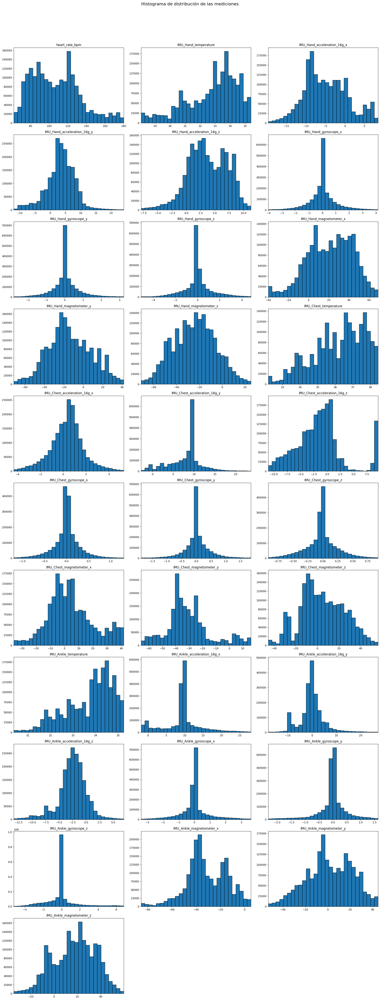

In [36]:
import numpy as np
import math
import matplotlib.pyplot as plt

# Lista de columnas que queremos excluir
excluded_cols = ['activityID']

# Seleccionamos solo las columnas numéricas y excluimos 'timestamp' y 'activityID'
pamap_numeric = (
    pamap_data
    .select_dtypes(include=['number'])
    .drop(columns=excluded_cols, errors='ignore')
)

# Obtenemos la lista de columnas numéricas restantes
columns = pamap_numeric.columns
num_attributes = len(columns)

# Definimos el layout: máximo 3 columnas por fila
cols = 3
rows = math.ceil(num_attributes / cols)

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()  # Para iterar fácilmente

for ax, col in zip(axes, columns):
    data = pamap_numeric[col].dropna()

    # Calculamos percentiles (por ejemplo, 1% y 99%)
    q1 = data.quantile(0.01)
    q99 = data.quantile(0.99)

    # Si el rango de valores en los percentiles es muy pequeño, evitamos errores
    if q1 == q99:
        ax.hist(data, bins=10, edgecolor='black')
        ax.set_title(col)
        ax.set_xlim([q1 - 1, q99 + 1])  # Ajuste mínimo para que no sea un rango vacío
        continue

    # Filtramos datos para el histograma (recortando outliers)
    data_filtered = data[(data >= q1) & (data <= q99)]

    # Generamos bins para ese rango filtrado
    bins = np.linspace(q1, q99, 30)

    # Graficamos solo los datos filtrados
    ax.hist(data_filtered, bins=bins, edgecolor='black')
    ax.set_title(col)

    # Ajustamos el límite de los ejes al rango filtrado
    ax.set_xlim([q1, q99])

# Si sobran ejes (subplots) porque hay menos columnas que subplots, los ocultamos
for ax in axes[num_attributes:]:
    ax.set_visible(False)

plt.suptitle("Histograma de distribución de las mediciones", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


## 2.9. Gráfica de densidad para los atributos (Pendiente)

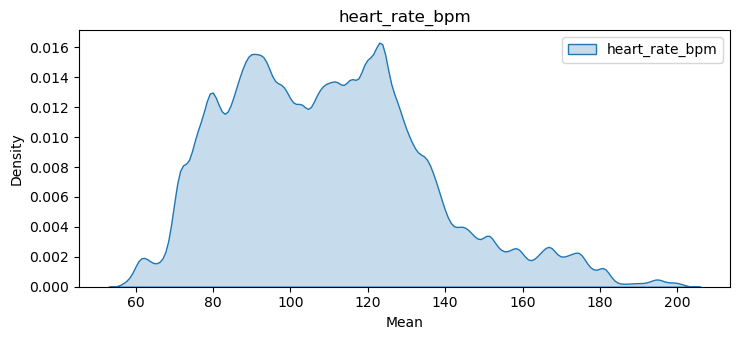

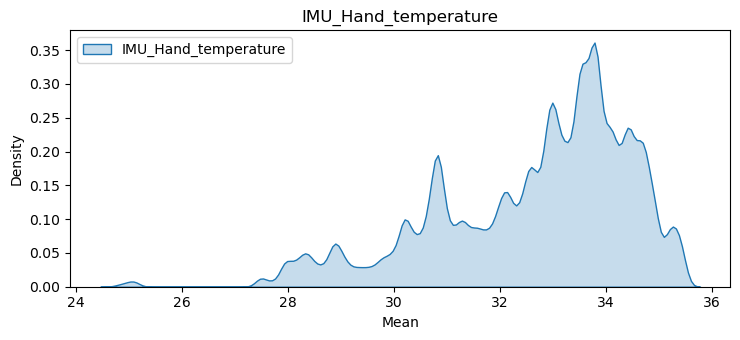

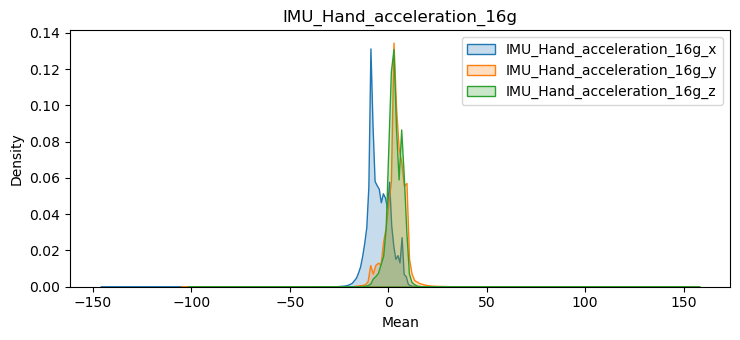

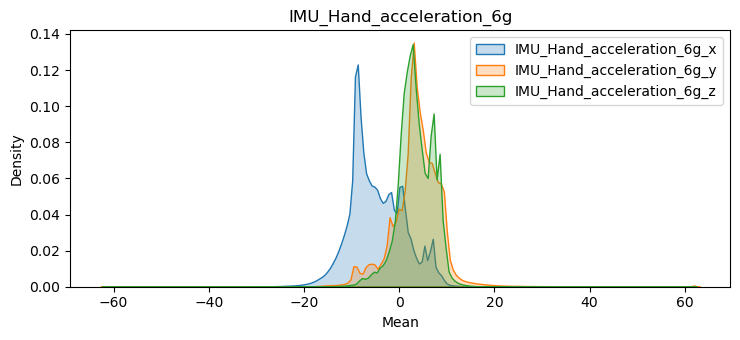

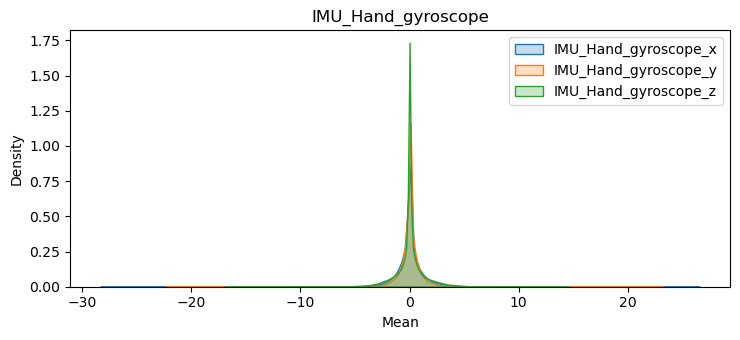

...

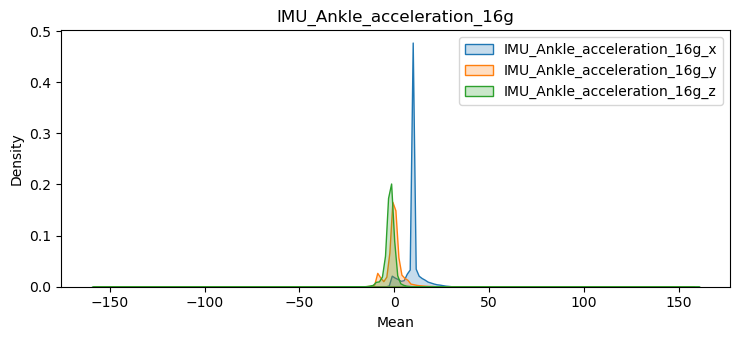

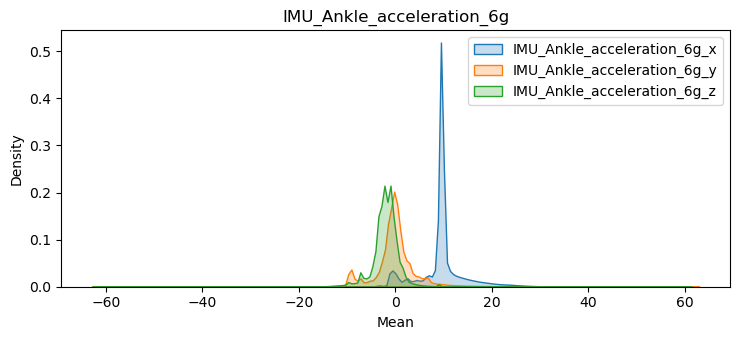

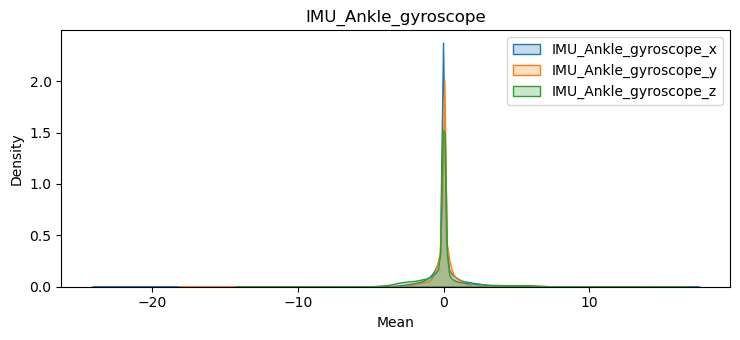

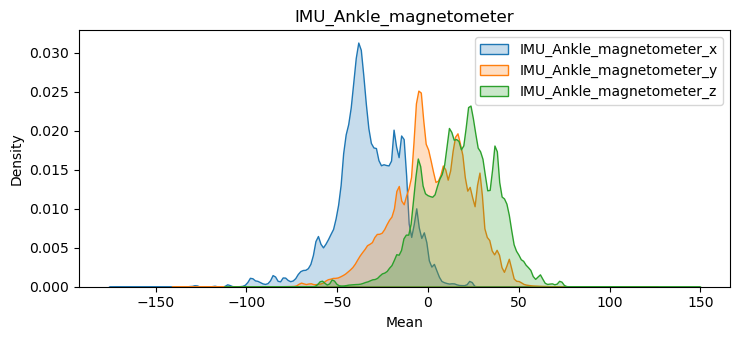

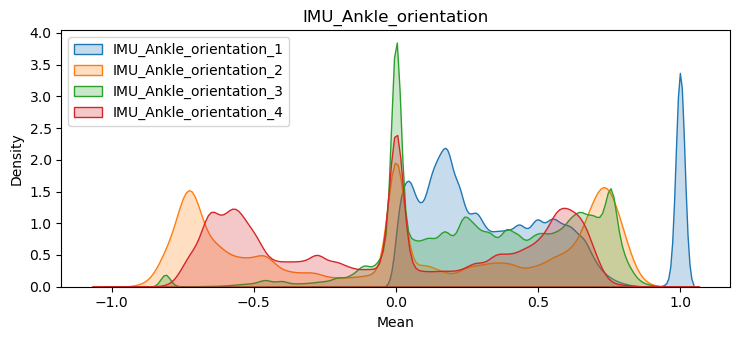

In [117]:
import seaborn as sns
import matplotlib.pyplot as plt

# Fuerza el estilo por defecto de Matplotlib
plt.style.use('default')

# Lista de columnas
columnas = [
    "heart_rate_bpm",
    "IMU_Hand_temperature",
    "IMU_Hand_acceleration_16g_x",
    "IMU_Hand_acceleration_16g_y",
    "IMU_Hand_acceleration_16g_z",
    "IMU_Hand_acceleration_6g_x",
    "IMU_Hand_acceleration_6g_y",
    "IMU_Hand_acceleration_6g_z",
    "IMU_Hand_gyroscope_x",
    "IMU_Hand_gyroscope_y",
    "IMU_Hand_gyroscope_z",
    "IMU_Hand_magnetometer_x",
    "IMU_Hand_magnetometer_y",
    "IMU_Hand_magnetometer_z",
    "IMU_Hand_orientation_1",
    "IMU_Hand_orientation_2",
    "IMU_Hand_orientation_3",
    "IMU_Hand_orientation_4",
    "IMU_Chest_temperature",
    "IMU_Chest_acceleration_16g_x",
    "IMU_Chest_acceleration_16g_y",
    "IMU_Chest_acceleration_16g_z",
    "IMU_Chest_acceleration_6g_x",
    "IMU_Chest_acceleration_6g_y",
    "IMU_Chest_acceleration_6g_z",
    "IMU_Chest_gyroscope_x",
    "IMU_Chest_gyroscope_y",
    "IMU_Chest_gyroscope_z",
    "IMU_Chest_magnetometer_x",
    "IMU_Chest_magnetometer_y",
    "IMU_Chest_magnetometer_z",
    "IMU_Chest_orientation_1",
    "IMU_Chest_orientation_2",
    "IMU_Chest_orientation_3",
    "IMU_Chest_orientation_4",
    "IMU_Ankle_temperature",
    "IMU_Ankle_acceleration_16g_x",
    "IMU_Ankle_acceleration_16g_y",
    "IMU_Ankle_acceleration_16g_z",
    "IMU_Ankle_acceleration_6g_x",
    "IMU_Ankle_acceleration_6g_y",
    "IMU_Ankle_acceleration_6g_z",
    "IMU_Ankle_gyroscope_x",
    "IMU_Ankle_gyroscope_y",
    "IMU_Ankle_gyroscope_z",
    "IMU_Ankle_magnetometer_x",
    "IMU_Ankle_magnetometer_y",
    "IMU_Ankle_magnetometer_z",
    "IMU_Ankle_orientation_1",
    "IMU_Ankle_orientation_2",
    "IMU_Ankle_orientation_3",
    "IMU_Ankle_orientation_4"
]

# Conjunto para llevar el control de las columnas ya graficadas
procesadas = set()

for col in columnas:
    # Si ya se procesó, pasamos a la siguiente
    if col in procesadas:
        continue

    # Si la columna contiene "orientation", se agrupan todas las orientaciones del sensor
    if "orientation" in col:
        # Se toma como base el nombre sin el número final, por ejemplo "IMU_Ankle_orientation"
        base = col.rsplit('_', 1)[0]
        # Se obtienen todas las columnas que empiezan con esa base
        group_cols = [c for c in columnas if c.startswith(base)]
        if group_cols:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in sorted(group_cols):
                sns.kdeplot(pamap_no_null[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.tight_layout()  # Ajusta la figura para evitar cortes
            plt.show()
            procesadas.update(group_cols)
        continue

    # Caso de variables agrupables por eje: _x, _y, _z
    if col.endswith('_x'):
        base = col[:-2]  # Se quita el sufijo "_x"
        col_y = base + '_y'
        col_z = base + '_z'
        if col_y in columnas and col_z in columnas:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in [col, col_y, col_z]:
                sns.kdeplot(pamap_no_null[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.tight_layout()
            plt.show()
            procesadas.update({col, col_y, col_z})
        else:
            plt.figure(figsize=(7.5, 3.5))
            sns.kdeplot(pamap_no_null[col], fill=True, label=col)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(col)
            plt.legend()
            plt.tight_layout()
            plt.show()
            procesadas.add(col)

    elif col.endswith('_y') or col.endswith('_z'):
        # Si se llega aquí es porque no se encontró la agrupación x,y,z completa
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(pamap_no_null[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.tight_layout()
        plt.show()
        procesadas.add(col)

    else:
        # Para el resto de columnas, se grafica individualmente
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(pamap_no_null[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.tight_layout()
        plt.show()
        procesadas.add(col)


KeyboardInterrupt: 

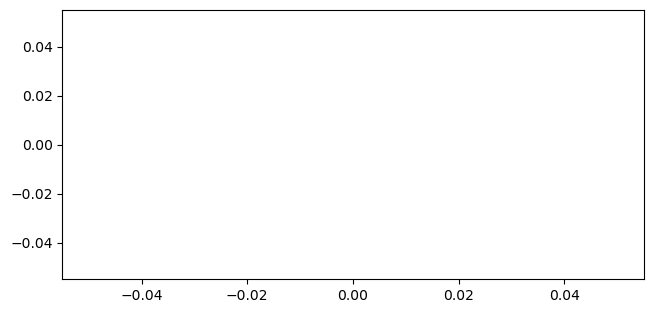

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de columnas
columnas = [
    "heart_rate_bpm",
    "IMU_Hand_temperature",
    "IMU_Hand_acceleration_16g_x",
    "IMU_Hand_acceleration_16g_y",
    "IMU_Hand_acceleration_16g_z",
    "IMU_Hand_acceleration_6g_x",
    "IMU_Hand_acceleration_6g_y",
    "IMU_Hand_acceleration_6g_z",
    "IMU_Hand_gyroscope_x",
    "IMU_Hand_gyroscope_y",
    "IMU_Hand_gyroscope_z",
    "IMU_Hand_magnetometer_x",
    "IMU_Hand_magnetometer_y",
    "IMU_Hand_magnetometer_z",
    "IMU_Hand_orientation_1",
    "IMU_Hand_orientation_2",
    "IMU_Hand_orientation_3",
    "IMU_Hand_orientation_4",
    "IMU_Chest_temperature",
    "IMU_Chest_acceleration_16g_x",
    "IMU_Chest_acceleration_16g_y",
    "IMU_Chest_acceleration_16g_z",
    "IMU_Chest_acceleration_6g_x",
    "IMU_Chest_acceleration_6g_y",
    "IMU_Chest_acceleration_6g_z",
    "IMU_Chest_gyroscope_x",
    "IMU_Chest_gyroscope_y",
    "IMU_Chest_gyroscope_z",
    "IMU_Chest_magnetometer_x",
    "IMU_Chest_magnetometer_y",
    "IMU_Chest_magnetometer_z",
    "IMU_Chest_orientation_1",
    "IMU_Chest_orientation_2",
    "IMU_Chest_orientation_3",
    "IMU_Chest_orientation_4",
    "IMU_Ankle_temperature",
    "IMU_Ankle_acceleration_16g_x",
    "IMU_Ankle_acceleration_16g_y",
    "IMU_Ankle_acceleration_16g_z",
    "IMU_Ankle_acceleration_6g_x",
    "IMU_Ankle_acceleration_6g_y",
    "IMU_Ankle_acceleration_6g_z",
    "IMU_Ankle_gyroscope_x",
    "IMU_Ankle_gyroscope_y",
    "IMU_Ankle_gyroscope_z",
    "IMU_Ankle_magnetometer_x",
    "IMU_Ankle_magnetometer_y",
    "IMU_Ankle_magnetometer_z",
    "IMU_Ankle_orientation_1",
    "IMU_Ankle_orientation_2",
    "IMU_Ankle_orientation_3",
    "IMU_Ankle_orientation_4"
]

# Conjunto para llevar el control de las columnas ya graficadas
procesadas = set()

for col in columnas:
    if col in procesadas:
        continue

    # Si la columna contiene "orientation", se agrupan todas las orientaciones del sensor
    if "orientation" in col:
        # Se toma como base el nombre sin el número final, por ejemplo "IMU_Ankle_orientation"
        base = col.rsplit('_', 1)[0]
        # Se obtienen todas las columnas que empiezan con esa base
        group_cols = [c for c in columnas if c.startswith(base)]
        if group_cols:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in sorted(group_cols):
                sns.kdeplot(pamap_no_null[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.show()
            procesadas.update(group_cols)
        continue

    # Caso de variables agrupables por eje: _x, _y, _z
    if col.endswith('_x'):
        base = col[:-2]  # Se quita el sufijo "_x"
        col_y = base + '_y'
        col_z = base + '_z'
        if col_y in columnas and col_z in columnas:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in [col, col_y, col_z]:
                sns.kdeplot(pamap_no_null[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.show()
            procesadas.update({col, col_y, col_z})
        else:
            plt.figure(figsize=(7.5, 3.5))
            sns.kdeplot(pamap_no_null[col], fill=True, label=col)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(col)
            plt.legend()
            plt.show()
            procesadas.add(col)
    elif col.endswith('_y') or col.endswith('_z'):
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(pamap_no_null[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.show()
        procesadas.add(col)
    else:
        # Para el resto de columnas, se grafica individualmente
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(pamap_no_null[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.show()
        procesadas.add(col)


De las gráficas anteriores obtenemos que se presentan muchos valores atípicos, estos afectan la distribución de nuestros datos, por lo que vamos a filtrar aquellos que se alejen más de 3 desviaciones estándar de la media.

## 2.10. Gráfica de caja y bigotes para la distribución de los atributos. (Pendiente)

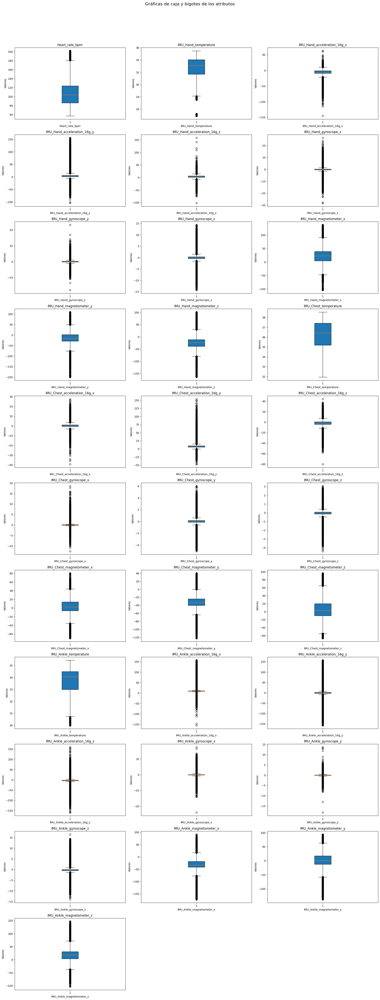

In [38]:
import matplotlib.pyplot as plt
import pandas as pd
import math

columnas_seleccionadas = ['heart_rate_bpm', 'IMU_Hand_temperature',
       'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
       'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
       'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
       'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
       'IMU_Hand_magnetometer_z', 'IMU_Chest_temperature',
       'IMU_Chest_acceleration_16g_x', 'IMU_Chest_acceleration_16g_y',
       'IMU_Chest_acceleration_16g_z', 'IMU_Chest_gyroscope_x',
       'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
       'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
       'IMU_Chest_magnetometer_z', 'IMU_Ankle_temperature',
       'IMU_Ankle_acceleration_16g_x', 'IMU_Ankle_acceleration_16g_y',
       'IMU_Ankle_acceleration_16g_z', 'IMU_Ankle_gyroscope_x',
       'IMU_Ankle_gyroscope_y', 'IMU_Ankle_gyroscope_z',
       'IMU_Ankle_magnetometer_x', 'IMU_Ankle_magnetometer_y',
       'IMU_Ankle_magnetometer_z']


df_numeric = pamap_data[columnas_seleccionadas]

num_attributes = df_numeric.shape[1]

cols = 3
rows = math.ceil(num_attributes / cols)

plt.figure(figsize=(20, 5 * rows))

for i, col in enumerate(df_numeric.columns):
    ax = plt.subplot(rows, cols, i + 1)
    ax.boxplot(df_numeric[col].dropna(), vert=True, patch_artist=True)
    ax.set_title(col)
    ax.set_xlabel(col)
    ax.set_ylabel("Valores")

plt.suptitle("Gráficas de caja y bigotes de los atributos", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

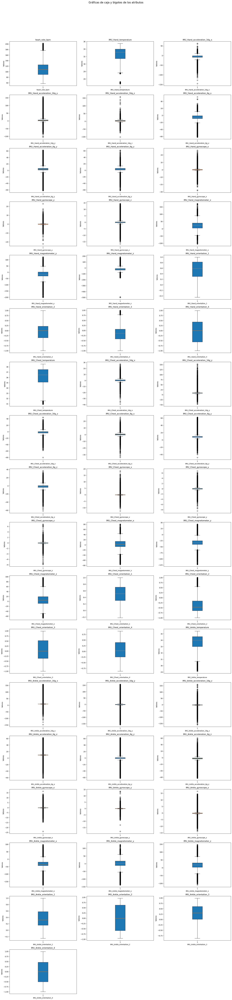

In [102]:
import matplotlib.pyplot as plt
import pandas as pd
import math

columnas_seleccionadas = [
    'heart_rate_bpm',
    'IMU_Hand_temperature',
    'IMU_Hand_acceleration_16g_x',
    'IMU_Hand_acceleration_16g_y',
    'IMU_Hand_acceleration_16g_z',
    'IMU_Hand_acceleration_6g_x',
    'IMU_Hand_acceleration_6g_y',
    'IMU_Hand_acceleration_6g_z',
    'IMU_Hand_gyroscope_x',
    'IMU_Hand_gyroscope_y',
    'IMU_Hand_gyroscope_z',
    'IMU_Hand_magnetometer_x',
    'IMU_Hand_magnetometer_y',
    'IMU_Hand_magnetometer_z',
    'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2',
    'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4',
    'IMU_Chest_temperature',
    'IMU_Chest_acceleration_16g_x',
    'IMU_Chest_acceleration_16g_y',
    'IMU_Chest_acceleration_16g_z',
    'IMU_Chest_acceleration_6g_x',
    'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z',
    'IMU_Chest_gyroscope_x',
    'IMU_Chest_gyroscope_y',
    'IMU_Chest_gyroscope_z',
    'IMU_Chest_magnetometer_x',
    'IMU_Chest_magnetometer_y',
    'IMU_Chest_magnetometer_z',
    'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2',
    'IMU_Chest_orientation_3',
    'IMU_Chest_orientation_4',
    'IMU_Ankle_temperature',
    'IMU_Ankle_acceleration_16g_x',
    'IMU_Ankle_acceleration_16g_y',
    'IMU_Ankle_acceleration_16g_z',
    'IMU_Ankle_acceleration_6g_x',
    'IMU_Ankle_acceleration_6g_y',
    'IMU_Ankle_acceleration_6g_z',
    'IMU_Ankle_gyroscope_x',
    'IMU_Ankle_gyroscope_y',
    'IMU_Ankle_gyroscope_z',
    'IMU_Ankle_magnetometer_x',
    'IMU_Ankle_magnetometer_y',
    'IMU_Ankle_magnetometer_z',
    'IMU_Ankle_orientation_1',
    'IMU_Ankle_orientation_2',
    'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4'
]

df_numeric = pamap_no_null[columnas_seleccionadas]

num_attributes = df_numeric.shape[1]

cols = 3
rows = math.ceil(num_attributes / cols)

plt.figure(figsize=(20, 5 * rows))

for i, col in enumerate(df_numeric.columns):
    ax = plt.subplot(rows, cols, i + 1)
    ax.boxplot(df_numeric[col].dropna(), vert=True, patch_artist=True)
    ax.set_title(col)
    ax.set_xlabel(col)
    ax.set_ylabel("Valores")

plt.suptitle("Gráficas de caja y bigotes de los atributos", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [107]:
import pandas as pd

# Suponiendo que pamap_corr_matrix es tu matriz de correlación calculada con el método de Spearman

# Definir los límites y las etiquetas para las categorías de correlación
limites = [0.7, 0.75, 0.8, 0.85]
categorias = ['Bajo', 'Medio', 'Alto', 'Muy alto']

# Inicializar una lista para almacenar los pares de columnas con su categoría de correlación
pares_correlacionados = []
corr_matrix = pamap_corr_matrix_2
# Iterar sobre la matriz de correlación
for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        col1 = corr_matrix.columns[i]
        col2 = corr_matrix.columns[j]
        corr_value = abs(corr_matrix.iloc[i, j])  # Tomar el valor absoluto de la correlación
        
        # Determinar la categoría de correlación
        categoria = None
        for limite, cat in zip(limites[::-1], categorias[::-1]):  # Iterar en orden inverso
            if corr_value > limite:
                categoria = cat
                break
        
        # Si la correlación supera el límite más bajo, agregar a la lista
        if categoria:
            pares_correlacionados.append((col1, col2, corr_value, categoria))

# Mostrar los pares de columnas con su categoría de correlación
for col1, col2, corr_value, categoria in pares_correlacionados:
    print(f"Las columnas '{col1}' y '{col2}' tienen una correlación {categoria} de {corr_value:.2f}")

TypeError: bad operand type for abs(): 'str'

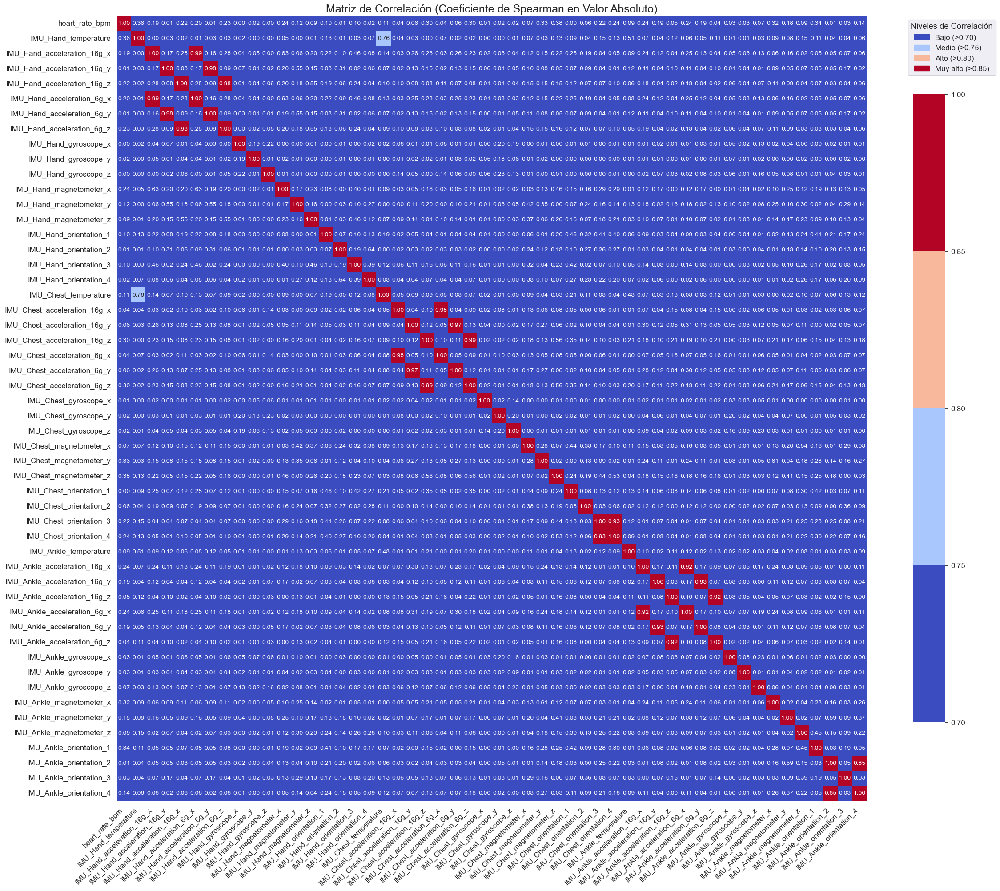

In [86]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import BoundaryNorm, LinearSegmentedColormap
from matplotlib.patches import Patch

# Suponiendo que pamap_corr_matrix es tu matriz de correlación calculada con el método de Spearman

# Calcular la matriz de correlación en términos absolutos
pamap_corr_matrix_abs = pamap_corr_matrix.abs()

# Definir los límites para las categorías de correlación
boundaries = [0.7, 0.75, 0.8, 0.85, 1.0]

# Crear un colormap discreto basado en 'coolwarm' con 4 colores
cmap = LinearSegmentedColormap.from_list(
    'coolwarm_discrete', plt.get_cmap('coolwarm')(np.linspace(0, 1, 4)), 4
)

# Crear una normalización basada en los límites definidos
norm = BoundaryNorm(boundaries, cmap.N, clip=True)

# Definir las categorías y sus colores asociados
categorias = ['Bajo (>0.70)', 'Medio (>0.75)', 'Alto (>0.80)', 'Muy alto (>0.85)']
colores = [cmap(norm(boundaries[i])) for i in range(len(boundaries) - 1)]

# Crear parches de color para la leyenda
patches = [Patch(color=colores[i], label=categorias[i]) for i in range(len(categorias))]

sns.set(font_scale=1.1)
plt.figure(figsize=(24, 20))

# Generar el mapa de calor
sns.heatmap(
    pamap_corr_matrix_abs,
    annot=True,         # Mostrar valores numéricos
    fmt=".2f",          # Formato de 2 decimales
    cmap=cmap,
    norm=norm,
    annot_kws={"size": 10},  # Tamaño de fuente de los valores dentro de las celdas
    square=False,
    cbar_kws={"shrink": 0.8} # Ajusta el tamaño de la barra de color
)

# Rotar etiquetas del eje X
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Ajusta automáticamente los márgenes
plt.tight_layout()

# Agregar la leyenda personalizada
plt.legend(handles=patches, title='Niveles de Correlación', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title('Matriz de Correlación (Coeficiente de Spearman en Valor Absoluto)', fontsize=18)
plt.show()


## Manejo de ruido

In [14]:
from scipy.ndimage import median_filter
pamap_no_filtered = pamap_data.copy()
columns_no_filter = ['activityID', 'subject_id', 'timestamp']
columns_for_filter = pamap_data.columns.difference(columns_no_filter)
pamap_filtered = pamap_data[columns_for_filter].apply(lambda col: median_filter(col, size=3))
pamap_final = pd.concat([pamap_data[columns_no_filter], pamap_filtered], axis=1)
pamap_data = pamap_final[pamap_data.columns]

### Caja y bigotes después del tratamiento

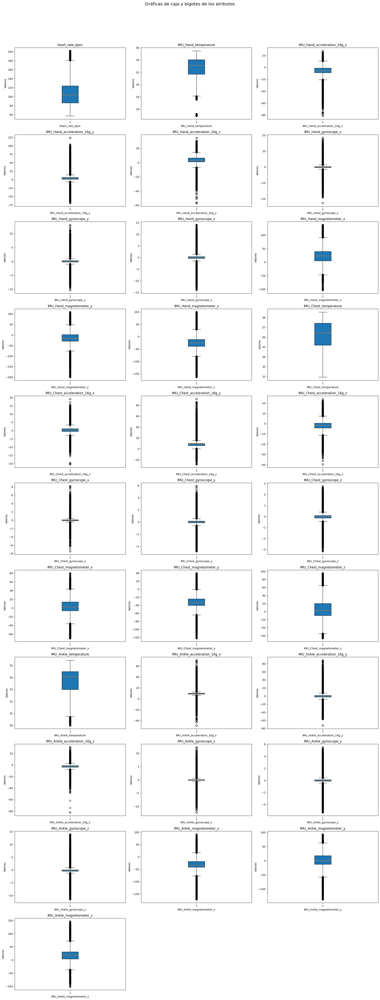

In [27]:
import matplotlib.pyplot as plt
import pandas as pd
import math

columnas_seleccionadas = ['heart_rate_bpm', 'IMU_Hand_temperature',
       'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
       'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
       'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
       'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
       'IMU_Hand_magnetometer_z', 'IMU_Chest_temperature',
       'IMU_Chest_acceleration_16g_x', 'IMU_Chest_acceleration_16g_y',
       'IMU_Chest_acceleration_16g_z', 'IMU_Chest_gyroscope_x',
       'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
       'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
       'IMU_Chest_magnetometer_z', 'IMU_Ankle_temperature',
       'IMU_Ankle_acceleration_16g_x', 'IMU_Ankle_acceleration_16g_y',
       'IMU_Ankle_acceleration_16g_z', 'IMU_Ankle_gyroscope_x',
       'IMU_Ankle_gyroscope_y', 'IMU_Ankle_gyroscope_z',
       'IMU_Ankle_magnetometer_x', 'IMU_Ankle_magnetometer_y',
       'IMU_Ankle_magnetometer_z']


df_numeric = pamap_filtred_after_final[columnas_seleccionadas]

num_attributes = df_numeric.shape[1]

cols = 3
rows = math.ceil(num_attributes / cols)

plt.figure(figsize=(20, 5 * rows))

for i, col in enumerate(df_numeric.columns):
    ax = plt.subplot(rows, cols, i + 1)
    ax.boxplot(df_numeric[col].dropna(), vert=True, patch_artist=True)
    ax.set_title(col)
    ax.set_xlabel(col)
    ax.set_ylabel("Valores")

plt.suptitle("Gráficas de caja y bigotes de los atributos", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Antes y despues

In [15]:
actividades = [0, 1, 2, 3, 4, 5, 6, 7, 12, 13, 16, 17, 24]
def graficar_antes_despues(pamap_data_antes, pamap_data_despues, actividades, sujeto="subject101"):
    for actividad in actividades:
        # Filtrar datos "antes"
        datos_antes = pamap_data_antes[
            (pamap_data_antes["subject_id"] == sujeto) & 
            (pamap_data_antes["activityID"] == actividad)
        ].head(1000)

        # Filtrar datos "después"
        datos_despues = pamap_data_despues[
            (pamap_data_despues["subject_id"] == sujeto) & 
            (pamap_data_despues["activityID"] == actividad)
        ].head(1000)

        # Si ambos están vacíos, salta
        if datos_antes.empty and datos_despues.empty:
            continue

        # Crear figura
        plt.figure(figsize=(12, 6))

        if not datos_antes.empty:
            plt.scatter(datos_antes["timestamp"], datos_antes["IMU_Hand_acceleration_16g_x"],
                        color='red', s=5, label="Antes - Puntos")
            plt.plot(datos_antes["timestamp"], datos_antes["IMU_Hand_acceleration_16g_x"],
                     color='darkred', linewidth=2, label="Antes - Línea")

        if not datos_despues.empty:
            plt.scatter(datos_despues["timestamp"], datos_despues["IMU_Hand_acceleration_16g_x"],
                        color='green', s=5, label="Después - Puntos")
            plt.plot(datos_despues["timestamp"], datos_despues["IMU_Hand_acceleration_16g_x"],
                     color='darkgreen', linewidth=2, label="Después - Línea")

        plt.title(f"Actividad {actividad}: Aceleración IMU de Mano (6g, eje X) - {sujeto}")
        plt.xlabel("Timestamp")
        plt.ylabel("IMU_Hand_acceleration_16g_x")
        plt.grid(True)
        plt.legend()
        plt.show()


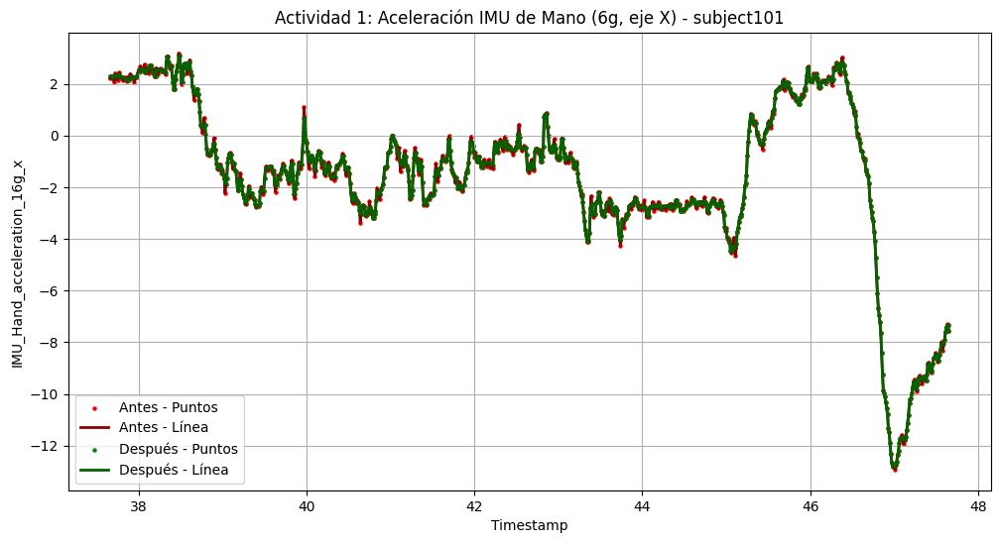

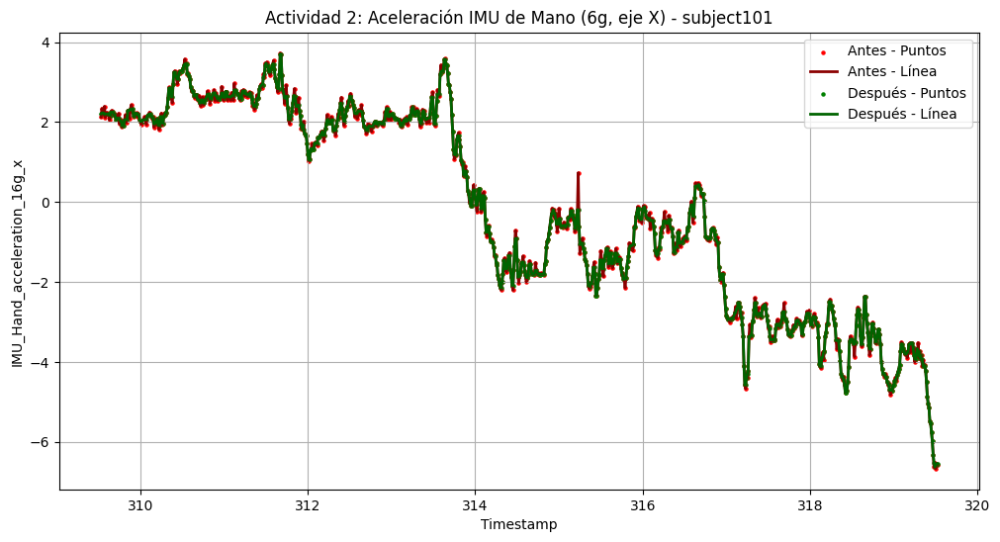

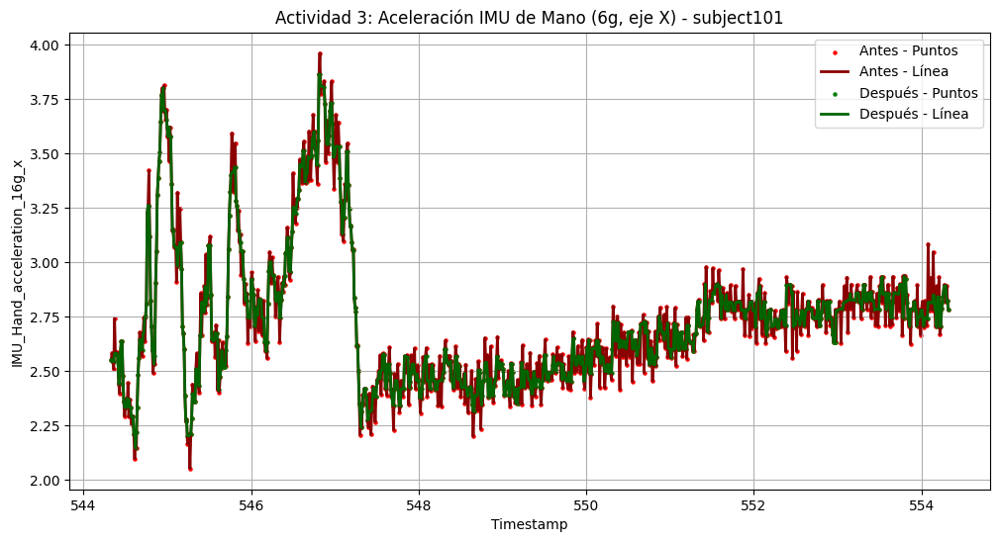

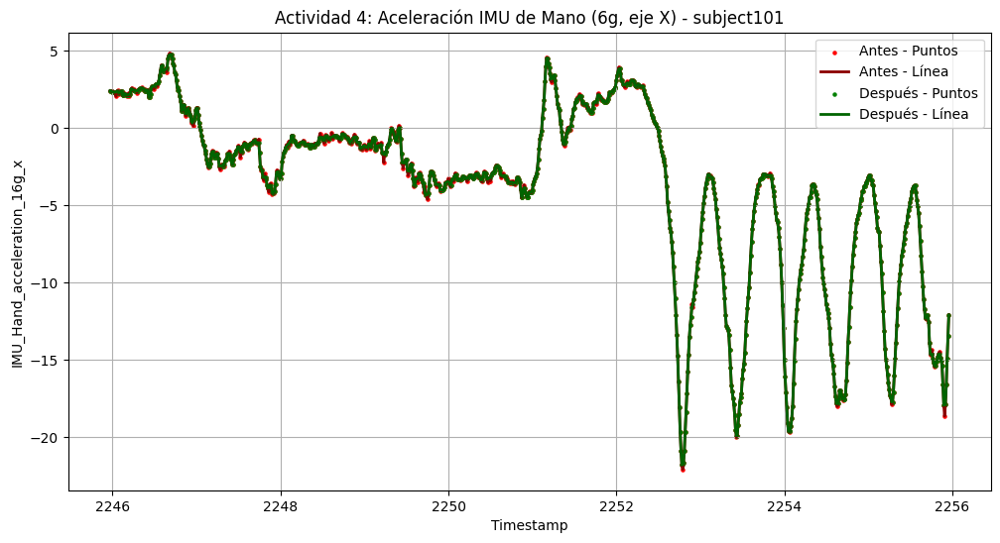

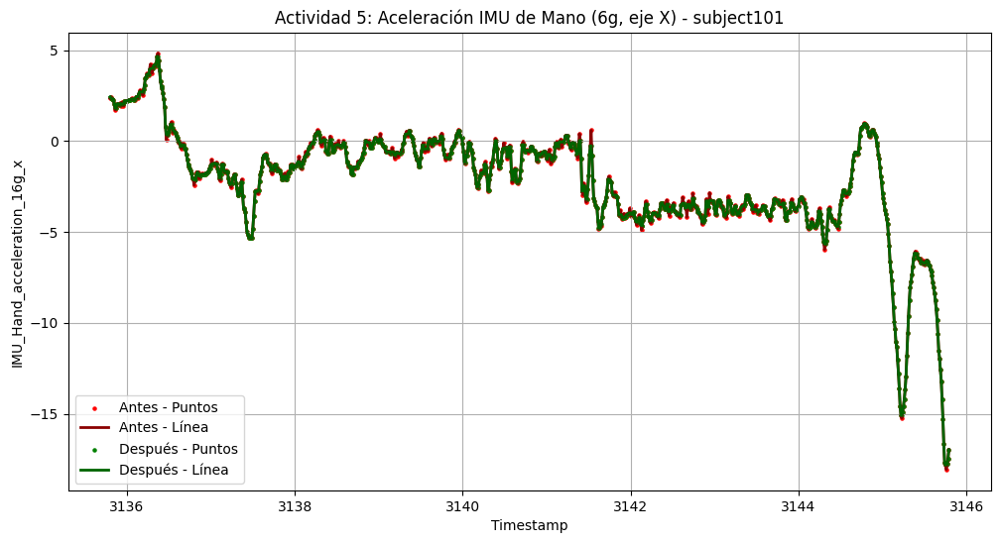

...

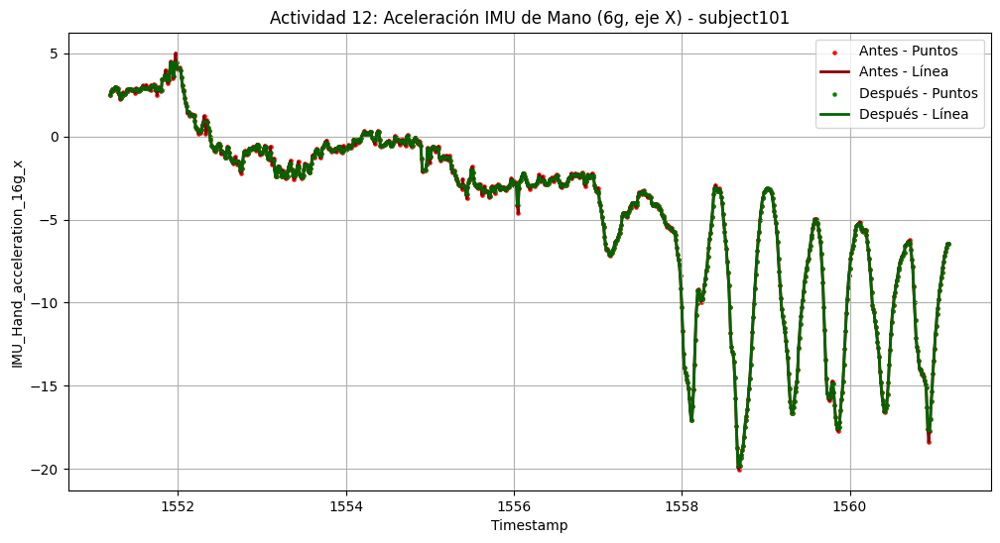

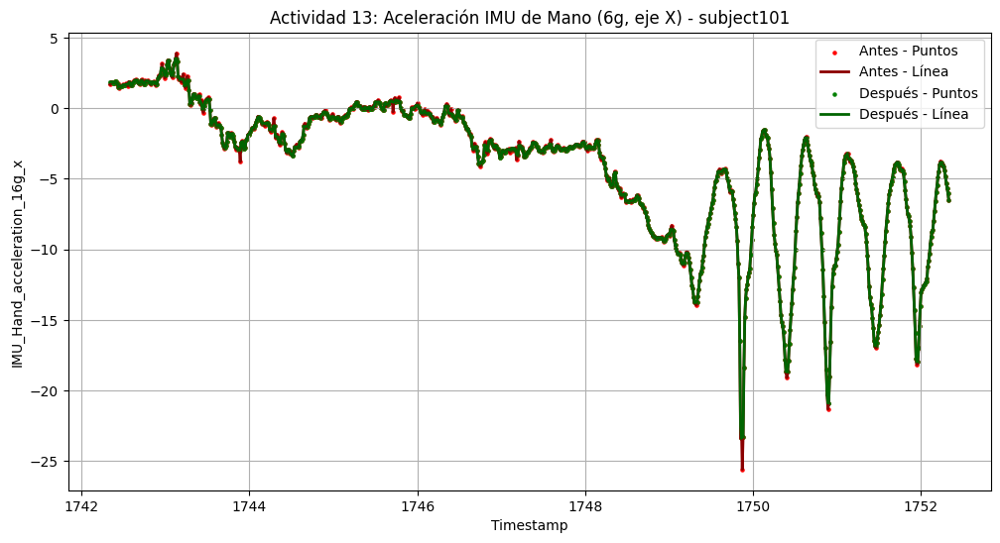

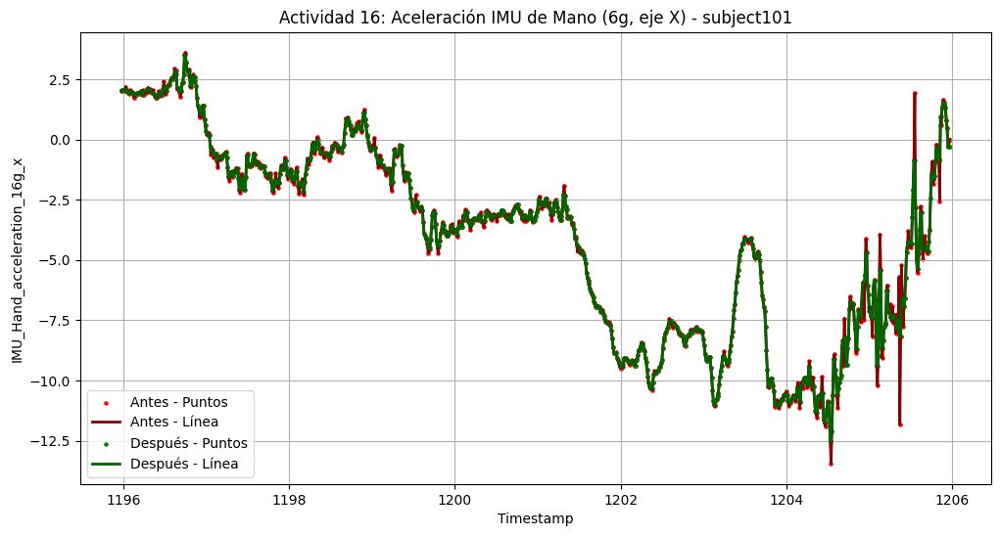

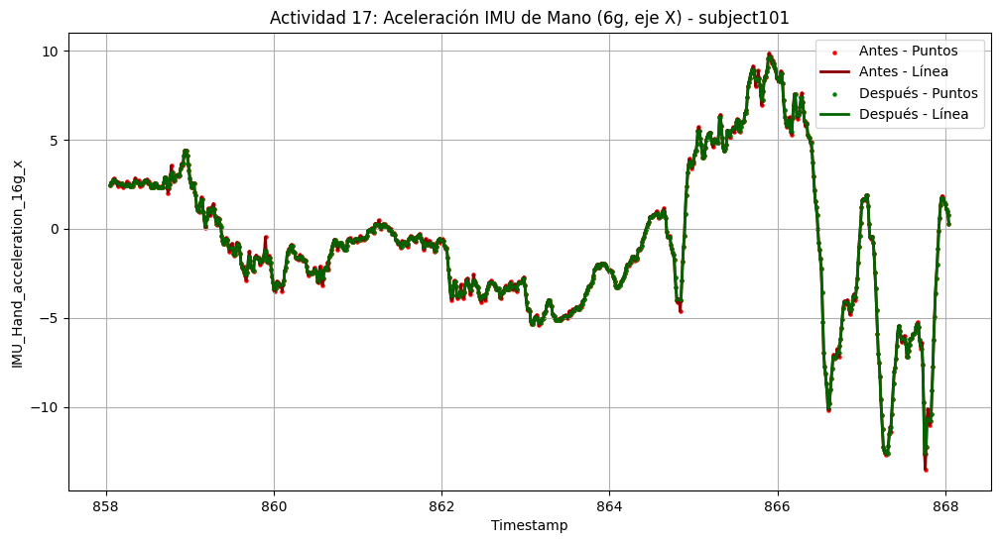

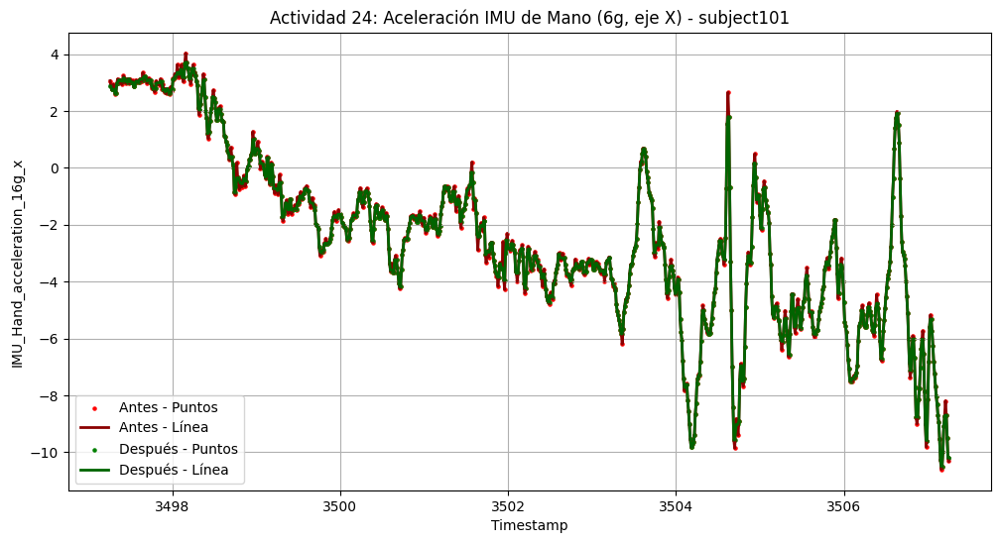

In [16]:
graficar_antes_despues(pamap_no_filtered, pamap_data, actividades)

# Segunda entrega

### 1. Segmentación por ventanas de tiempo

In [22]:
import pandas as pd

def segment_by_window(group, window_size):
    """
    Segments data into windows of specified size.

    Args:
        group (pd.DataFrame): Subject's data.
        window_size (int): Size of each time window.

    Returns:
        list: List of DataFrames, each representing a window of data.
    """
    windows = []
    for start in range(0, len(group), window_size):
        end = start + window_size
        if end <= len(group):
            window = group.iloc[start:end].copy()
            windows.append(window)
    return windows

def add_window_metadata(windows, subject_id):
    """
    Adds metadata like window number, window ID, and majority label.

    Args:
        windows (list): List of window DataFrames.
        subject_id (int): Subject identifier.

    Returns:
        list: List of windows with added metadata.
    """
    for i, window in enumerate(windows):
        window['subject_id'] = subject_id
        window['window_number'] = i
        window['window_id'] = f"{subject_id}_{window['window_number'].iloc[0]}"

        majority_label = get_majority_label(window)
        window['labels_in_window'] = [majority_label] * len(window)
    return windows

def get_majority_label(window):
    """
    Gets the majority label for a window.

    Args:
        window (pd.DataFrame): Window data.

    Returns:
        str: Majority label, or None if no majority.
    """
    label_counts = window['activityID'].value_counts()
    majority_label = label_counts.idxmax() if label_counts.max() / len(window) > 0.5 else window['label'].iloc[0]
    return majority_label

def process_subject_data(mhealth_df, window_size):
    """
    Processes all subject data by segmenting and adding metadata.

    Args:
        mhealth_df (pd.DataFrame): Data of multiple subjects.
        window_size (int): Size of each time window.

    Returns:
        list: List of windows with metadata.
    """
    all_windows = []
    for subject_id, group in mhealth_df.groupby('subject_id'):
        group = group.reset_index(drop=True)

        windows = segment_by_window(group, window_size)
        windows = add_window_metadata(windows, subject_id)
        all_windows.extend(windows)
    
    return all_windows

def concatenate_windows(windows):
    """
    Concatenates all windows into a single DataFrame.

    Args:
        windows (list): List of window DataFrames.

    Returns:
        pd.DataFrame: Concatenated DataFrame of all windows.
    """
    return pd.concat(windows).reset_index(drop=True)

def display_basic_info(ventanas_df, windows):
    """
    Displays basic info about windows and their majority labels.

    Args:
        ventanas_df (pd.DataFrame): DataFrame of windows with metadata.
        windows (list): List of processed windows.
    """
    print(f"Ventanas generadas: {len(windows)}")
    print(f"Tamaño del DataFrame de ventanas: {ventanas_df.shape}")

    for window_id, group in ventanas_df.groupby('window_id'):
        majority_label = group['labels_in_window'].iloc[0]
        print(f"Window ID: {window_id} - Majority Label: {majority_label}")

# Parameters
window_size = 150  # 3 seconds * 50 Hz

print(pamap_data.shape)
windows = process_subject_data(pamap_data, window_size)

# Concatenate all windows into a single DataFrame
pamap_windowed = concatenate_windows(windows)

display_basic_info(pamap_windowed, windows)


(1942872, 30)
Ventanas generadas: 12948
Tamaño del DataFrame de ventanas: (1942200, 33)
Window ID: subject101_0 - Majority Label: 1
Window ID: subject101_1 - Majority Label: 1
Window ID: subject101_10 - Majority Label: 1
Window ID: subject101_100 - Majority Label: 1
Window ID: subject101_1000 - Majority Label: 4
Window ID: subject101_1001 - Majority Label: 4
Window ID: subject101_1002 - Majority Label: 4
Window ID: subject101_1003 - Majority Label: 4
Window ID: subject101_1004 - Majority Label: 4
Window ID: subject101_1005 - Majority Label: 4
Window ID: subject101_1006 - Majority Label: 4
Window ID: subject101_1007 - Majority Label: 4
Window ID: subject101_1008 - Majority Label: 4
Window ID: subject101_1009 - Majority Label: 4
Window ID: subject101_101 - Majority Label: 1
Window ID: subject101_1010 - Majority Label: 4
Window ID: subject101_1011 - Majority Label: 4
Window ID: subject101_1012 - Majority Label: 4
Window ID: subject101_1013 - Majority Label: 4
Window ID: subject101_1014 - 

In [23]:
windows_per_subject = pamap_windowed.groupby('subject_id').size()/150
print(f'Promedio de ventanas por cada sujeto: {windows_per_subject.mean()}')

windows_per_activity = pamap_windowed.groupby('activityID').size()/150
print(f'Promedio de ventanas por cada actividad: {windows_per_activity.mean()}')

Promedio de ventanas por cada sujeto: 1438.6666666666667
Promedio de ventanas por cada actividad: 1079.0


## 2. Extracción de características

Ahora bien, en el estudio de Lara (2011), dieron a relucir que la información provista por datos de signos vitales no es necesaria si las actividades a reconocer son _caminando_ o _bajando_, pero, para actividades como _corriendo_, _estar sentado_ o _asendiendo_ pueden ser de utilidad. Sin embargo, en el artículo de Rehman (2024), hacen uso solamente de los sensores del acelerómetro giroscopio y magnetométro, debido a que otro estudió de igual forma lo trabajó así. Por ello nosotros tomamos el mismo enfoque. 

In [24]:
class InertialSensor:
    def __init__(self, x, y, z):
        """
        Inicializa el acelerómetro con sus 3 señales.
        
        Parámetros:
          x: array-like, señal del eje x.
          y: array-like, señal del eje y.
          z: array-like, señal del eje z.
        """
        self.x = np.array(x)
        self.y = np.array(y)
        self.z = np.array(z)
        
    def compute_magnitude(self):
        return np.sqrt(self.x**2 + self.y**2 + self.z**2)
    
    def extract_features(self):
        # 1. Medias de cada eje
        mean_x = np.mean(self.x)
        mean_y = np.mean(self.y)
        mean_z = np.mean(self.z)
        
        # 2. Desviaciones estándar
        std_x = np.std(self.x)
        std_y = np.std(self.y)
        std_z = np.std(self.z)
        
        # 3. Valores máximos
        max_x = np.max(self.x)
        max_y = np.max(self.y)
        max_z = np.max(self.z)
        
        # 4. Correlaciones entre cada par de ejes
        corr_xy = np.corrcoef(self.x, self.y)[0, 1]
        corr_xz = np.corrcoef(self.x, self.z)[0, 1]
        corr_yz = np.corrcoef(self.y, self.z)[0, 1]
        
        # 5,6,7,8. Features derivadas de la magnitud
        magnitude = self.compute_magnitude()
        mean_magnitude = np.mean(magnitude)
        std_magnitude = np.std(magnitude)
        auc = np.sum(magnitude)
        mean_diff = np.mean(np.diff(magnitude)) if len(magnitude) > 1 else 0.0
        
        # Vector de features
        feature_vector = np.array([
            mean_x, mean_y, mean_z,
            std_x, std_y, std_z,
            max_x, max_y, max_z,
            corr_xy, corr_xz, corr_yz,
            mean_magnitude, std_magnitude, auc, mean_diff
        ])
        
        return feature_vector

In [25]:
import numpy as np
df_to_extract_features = pamap_windowed
numeric_features_list = []
labels = []

for seg, group in df_to_extract_features.groupby("window_id"):
    #Features obtenidos de los sensores en la mano
    H_acc_features = InertialSensor(
        group.IMU_Hand_acceleration_16g_x,
        group.IMU_Hand_acceleration_16g_y,
        group.IMU_Hand_acceleration_16g_z
    ).extract_features()
    H_gyro_features = InertialSensor(
        group.IMU_Hand_gyroscope_x,
        group.IMU_Hand_gyroscope_y,
        group.IMU_Hand_gyroscope_z,
    ).extract_features()
    H_mag_features = InertialSensor(
        group.IMU_Hand_magnetometer_x,
        group.IMU_Hand_magnetometer_y,
        group.IMU_Hand_magnetometer_z,
    ).extract_features()
        #Features obtenidos de los sensores en el pecho
    C_acc_features = InertialSensor(
        group.IMU_Chest_acceleration_16g_x,
        group.IMU_Chest_acceleration_16g_y,
        group.IMU_Chest_acceleration_16g_z
    ).extract_features()
    C_gyro_features = InertialSensor(
        group.IMU_Chest_gyroscope_x,
        group.IMU_Chest_gyroscope_y,
        group.IMU_Chest_gyroscope_z,
    ).extract_features()
    C_mag_features = InertialSensor(
        group.IMU_Chest_magnetometer_x,
        group.IMU_Chest_magnetometer_y,
        group.IMU_Chest_magnetometer_z,
    ).extract_features()
    #Features obtenidos de los sensores en el tobillo
    A_acc_features = InertialSensor(
        group.IMU_Ankle_acceleration_16g_x,
        group.IMU_Ankle_acceleration_16g_y,
        group.IMU_Ankle_acceleration_16g_z
    ).extract_features()
    A_gyro_features = InertialSensor(
        group.IMU_Ankle_gyroscope_x,
        group.IMU_Ankle_gyroscope_y,
        group.IMU_Ankle_gyroscope_z,
    ).extract_features()
    A_mag_features = InertialSensor(
        group.IMU_Ankle_magnetometer_x,
        group.IMU_Ankle_magnetometer_y,
        group.IMU_Ankle_magnetometer_z,
    ).extract_features()
    
    feature_vector = np.concatenate([
        H_acc_features, H_gyro_features, H_mag_features,
        C_acc_features, C_gyro_features, C_mag_features,
        A_acc_features, A_gyro_features, A_mag_features
    ]).astype(float)
    
    numeric_features_list.append(feature_vector)
    labels.append(group["labels_in_window"].iloc[0])

sensor_locations = ["hand"]
sensor_types = ["acc", "gyro", "mag"]
feature_names = [
    "mean_x", "mean_y", "mean_z", "std_x", "std_y", "std_z",
    "max_x", "max_y", "max_z", "corr_xy", "corr_xz", "corr_yz",
    "mean_mag", "std_mag", "auc", "mean_diff"
]

feature_columns = [
    f"{loc}_{typ}_{feat}"
    for loc in sensor_locations
    for typ in sensor_types
    for feat in feature_names
]
        
sensor_locations = ["chest"]
sensor_types = ["acc", "gyro", "mag"]
feature_columns.extend([
    f"{loc}_{typ}_{feat}"
    for loc in sensor_locations
    for typ in sensor_types
    for feat in feature_names
])

sensor_locations = ["ankle"]
sensor_types = ["acc", "gyro", "mgnt"]
feature_columns.extend([
    f"{loc}_{typ}_{feat}"
    for loc in sensor_locations
    for typ in sensor_types
    for feat in feature_names
])

# Create DataFrame for numeric features and convert to float
df_numeric = pd.DataFrame(np.array(numeric_features_list), columns=feature_columns)

# Create DataFrame for labels
df_labels = pd.DataFrame(labels, columns=["activity"])

# Concatenate numeric features and labels
pamap_features = pd.concat([df_numeric, df_labels], axis=1)

# Optionally, check the data types to confirm
pamap_features.shape
pamap_features

,hand_acc_mean_x,hand_acc_mean_y,hand_acc_mean_z,hand_acc_std_x,hand_acc_std_y,hand_acc_std_z,hand_acc_max_x,hand_acc_max_y,hand_acc_max_z,hand_acc_corr_xy,...,ankle_mgnt_max_y,ankle_mgnt_max_z,ankle_mgnt_corr_xy,ankle_mgnt_corr_xz,ankle_mgnt_corr_yz,ankle_mgnt_mean_mag,ankle_mgnt_std_mag,ankle_mgnt_auc,ankle_mgnt_mean_diff,activity
0,1.482,7.188,6.262,1.486,0.864,0.744,3.089,9.172,8.316,-0.062,...,-35.508,-57.613,-0.588,-0.218,0.258,92.159,0.288,13823.877,0.003,1
1,-1.573,9.095,3.060,0.677,1.232,1.007,0.687,11.615,5.145,-0.438,...,-35.517,-57.969,-0.954,0.133,-0.304,92.313,0.352,13846.921,-0.002,1
2,0.315,5.718,7.956,0.070,0.169,0.118,0.505,5.962,8.264,-0.369,...,44.732,-8.874,-0.211,0.005,-0.017,47.366,0.352,7104.862,0.001,1
3,3.794,-3.949,-8.207,0.041,0.054,0.061,3.954,-3.809,-8.011,0.080,...,21.353,40.580,-0.181,0.014,0.022,49.743,0.301,7461.496,-0.005,1
4,-2.690,6.508,6.573,1.091,1.284,0.824,-0.006,9.795,8.249,-0.250,...,-34.670,3.557,-0.879,0.013,-0.021,62.639,0.247,9395.879,0.002,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12943,0.531,11.031,-1.333,4.758,12.546,5.236,12.166,33.163,10.501,-0.205,...,-17.655,22.886,-0.963,0.880,-0.763,46.330,0.547,6949.488,-0.004,24
12944,0.224,7.422,-2.340,5.087,14.670,6.896,12.801,31.914,28.654,0.034,...,-13.830,22.460,-0.963,0.640,-0.485,45.759,0.647,6863.855,-0.001,24
12945,-2.860,11.354,1.614,2.773,5.559,3.565,8.196,25.256,14.554,-0.109,...,23.540,16.623,-0.262,0.435,-0.881,46.600,0.707,6990.016,0.006,24
12946,-2.439,7.337,-0.470,5.133,10.477,7.591,9.744,27.096,11.336,-0.135,...,-10.380,15.780,-0.986,0.131,-0.050,46.479,0.718,6971.784,-0.001,24


# Train Test Splitting, Class imabalnce & Normalization

## Class imbalance

In [8]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold, cross_val_score
from imblearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE  


X = pamap_features.drop(columns=['activity']).values  
y = pamap_features['activity'].values 
 
scaler = MinMaxScaler()

def execute_pipeline(model, X, y):
    pipeline = make_pipeline(
        SMOTE(sampling_strategy='all', random_state=42), 
        scaler,  
        model
    )
    pipeline.fit(X, y)
    scorespipe = cross_val_score(pipeline, X, y, cv=10, scoring="f1_macro")
    return scorespipe

NameError: name 'pamap_features' is not defined

## NB

In [29]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb_results = execute_pipeline(nb, X, y)
print(nb_results.mean())

0.8359113995293782


## Regresión Logistica

In [30]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(max_iter=1000)
lr_results = execute_pipeline(lr, X, y)
print(lr_results.mean())

0.8631368032339852


## RF

In [31]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf_results = execute_pipeline(rf, X, y)
print(rf_results.mean())

0.8991842367400302


## Perceptron

In [32]:
from sklearn.linear_model import Perceptron
perceptron = Perceptron()
percep_results = execute_pipeline(perceptron, X, y)
print(percep_results.mean())

0.8308864154461117


## XGBoost

In [ ]:
from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb_results = execute_pipeline(xgb, X, y)
print(xgb_results.mean())

# Reducción de características

In [30]:
X = pamap_features.drop(columns=["activity"], errors="ignore")
y = pamap_features.activity

# PCA

In [31]:
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
import numpy as np

def pipelinear_with_pca(model, X, y):
    # Print the original number of features.
    print("Original feature count:", X.shape[1])
    
    # Initialize PCA to preserve 95% of variance.
    pca = PCA(n_components=0.95)
    
    # Create the pipeline; ensure 'scaler' is defined elsewhere.
    pipe = make_pipeline(scaler, pca, model)
    
    # Fit the pipeline on the data.
    pipe.fit(X, y)
    
    # After fitting, PCA computes the actual number of components needed.
    print("Feature count after PCA:", pca.n_components_)
    
    # Evaluate the pipeline using cross-validation.
    scorespipe = cross_val_score(pipe, X, y, cv=10, scoring="f1_macro")
    print("Cross-validation scores:", scorespipe)
    print("Average score:", np.average(scorespipe))

    return scorespipe

## NB

In [32]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb_pca_results = pipelinear_with_pca(nb, X, y)

Original feature count: 144
Feature count after PCA: 65
Cross-validation scores: [0.58933273 0.80610514 0.74482567 0.83525259 0.86377646 0.76609233
 0.81020253 0.86451221 0.81787092 0.58993468]
Average score: 0.7687905271166209


## Regresión Logística

In [33]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(max_iter=1000)
lr_pca_results = pipelinear_with_pca(lr, X, y)

Original feature count: 144
Feature count after PCA: 65
Cross-validation scores: [0.73509159 0.88349572 0.86079675 0.92058927 0.93106935 0.84963461
 0.87629436 0.90719376 0.88470596 0.70394117]
Average score: 0.8552812535220553


## RF

In [34]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf_pca_results = pipelinear_with_pca(rf, X, y)

Original feature count: 144
Feature count after PCA: 65
Cross-validation scores: [0.70605283 0.91529764 0.86437164 0.90378982 0.92994209 0.86689691
 0.87297942 0.90931895 0.88779785 0.86881673]
Average score: 0.8725263885900167


## Perceptron

In [35]:
from sklearn.linear_model import Perceptron
perceptron = Perceptron()
percep_pca_results = pipelinear_with_pca(perceptron, X, y)

Original feature count: 144
Feature count after PCA: 65
Cross-validation scores: [0.72132985 0.84319889 0.82834735 0.85878729 0.88654828 0.8112023
 0.79583376 0.88197016 0.86743362 0.64794411]
Average score: 0.8142595620742836


## Aquí termina

### 2.13.2. Eliminar valores atípicos

In [140]:
pamap_remove_redundant.columns

Index(['timestamp', 'activityID', 'heart_rate_bpm', 'IMU_Hand_temperature',
       'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
       'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
       'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
       'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
       'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
       'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
       'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
       'IMU_Chest_acceleration_6g_x', 'IMU_Chest_acceleration_6g_y',
       'IMU_Chest_acceleration_6g_z', 'IMU_Chest_gyroscope_x',
       'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
       'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
       'IMU_Chest_magnetometer_z', 'IMU_Chest_orientation_1',
       'IMU_Chest_orientation_2', 'IMU_Chest_orientation_4',
       'IMU_Ankle_temperature', 'IMU_Ankle_acceleration_16g_x',
       'IMU_Ankle_acceleration_16g_y', 'IMU_Ankle_acceleratio

In [150]:
import pandas as pd
import numpy as np
from sklearn.neighbors import LocalOutlierFactor

# Suponiendo que ya tienes cargado el DataFrame: pamap_remove_redundant

# Lista de columnas a procesar
cols = [
    'heart_rate_bpm', 'IMU_Hand_temperature',
    'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
    'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
    'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
    'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
    'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
    'IMU_Chest_acceleration_6g_x', 'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z', 'IMU_Chest_gyroscope_x',
    'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
    'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
    'IMU_Chest_magnetometer_z', 'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2', 'IMU_Chest_orientation_4',
    'IMU_Ankle_temperature', 'IMU_Ankle_acceleration_16g_x',
    'IMU_Ankle_acceleration_16g_y', 'IMU_Ankle_acceleration_16g_z',
    'IMU_Ankle_gyroscope_x', 'IMU_Ankle_gyroscope_y',
    'IMU_Ankle_gyroscope_z', 'IMU_Ankle_magnetometer_x',
    'IMU_Ankle_magnetometer_y', 'IMU_Ankle_magnetometer_z',
    'IMU_Ankle_orientation_1', 'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4'
]

# Parámetros para LOF
n_neighbors = 10      # Número de vecinos a considerar
contamination = 0.05  # Proporción estimada de outliers

# Lista para almacenar DataFrames limpios de cada sujeto
cleaned_dfs = []

# Agrupar por 'subject_id'
for subject, group in pamap_remove_redundant.groupby('subject_id'):
    # Ordenar por timestamp
    group = group.sort_values('timestamp').reset_index(drop=True)
    
    # Segmentar cada grupo en bloques de 2000 mediciones
    segments = [group.iloc[i:i+2000] for i in range(0, len(group), 2000)]
    cleaned_segments = []
    
    for segment in segments:
        # Conjunto para acumular los índices de filas que resulten atípicas en cualquier columna
        outlier_idx = set()
        
        for col in cols:
            # Verificar que la columna exista en el segmento
            if col not in segment.columns:
                continue
            
            # Extraer los valores de la columna y darles la forma adecuada para LOF
            X = segment[[col]].values
            
            # Ajustar n_neighbors si el segmento es muy pequeño
            n_neighbors_eff = min(n_neighbors, len(segment) - 1) if len(segment) > 1 else 1
            
            # Inicializar LOF
            lof = LocalOutlierFactor(n_neighbors=n_neighbors_eff, contamination=contamination)
            
            try:
                # El método fit_predict devuelve 1 para datos normales y -1 para outliers
                labels = lof.fit_predict(X)
            except Exception as e:
                print(f"Error al procesar la columna {col} en el segmento: {e}")
                continue
            
            # Identificar las filas marcadas como outliers (label = -1)
            outlier_indices = segment.index[labels == -1].tolist()
            outlier_idx.update(outlier_indices)
        
        # Eliminar las filas detectadas como outliers en el segmento
        cleaned_segment = segment.drop(index=outlier_idx)
        cleaned_segments.append(cleaned_segment)
    
    # Concatenar los segmentos limpios para el sujeto actual
    cleaned_subject = pd.concat(cleaned_segments)
    cleaned_dfs.append(cleaned_subject)

# Reensamblar el DataFrame limpio completo
cleaned_df = pd.concat(cleaned_dfs).reset_index(drop=True)

print("Dimensiones originales:", pamap_remove_redundant.shape)
print("Dimensiones después de eliminar atípicos:", cleaned_df.shape)


Dimensiones originales: (2872533, 44)
Dimensiones después de eliminar atípicos: (509189, 44)


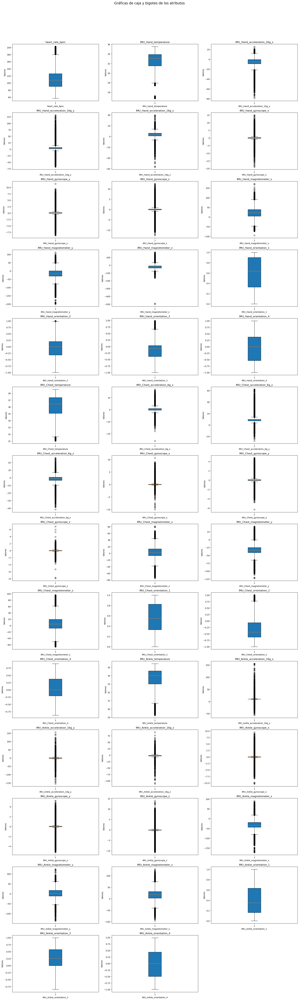

In [152]:
import matplotlib.pyplot as plt
import pandas as pd
import math

columnas_seleccionadas = [
    'heart_rate_bpm', 'IMU_Hand_temperature',
    'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
    'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
    'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
    'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
    'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
    'IMU_Chest_acceleration_6g_x', 'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z', 'IMU_Chest_gyroscope_x',
    'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
    'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
    'IMU_Chest_magnetometer_z', 'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2', 'IMU_Chest_orientation_4',
    'IMU_Ankle_temperature', 'IMU_Ankle_acceleration_16g_x',
    'IMU_Ankle_acceleration_16g_y', 'IMU_Ankle_acceleration_16g_z',
    'IMU_Ankle_gyroscope_x', 'IMU_Ankle_gyroscope_y',
    'IMU_Ankle_gyroscope_z', 'IMU_Ankle_magnetometer_x',
    'IMU_Ankle_magnetometer_y', 'IMU_Ankle_magnetometer_z',
    'IMU_Ankle_orientation_1', 'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4'
]

df_numeric = cleaned_df[columnas_seleccionadas]

num_attributes = df_numeric.shape[1]

cols = 3
rows = math.ceil(num_attributes / cols)

plt.figure(figsize=(20, 5 * rows))

for i, col in enumerate(df_numeric.columns):
    ax = plt.subplot(rows, cols, i + 1)
    ax.boxplot(df_numeric[col].dropna(), vert=True, patch_artist=True)
    ax.set_title(col)
    ax.set_xlabel(col)
    ax.set_ylabel("Valores")

plt.suptitle("Gráficas de caja y bigotes de los atributos", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

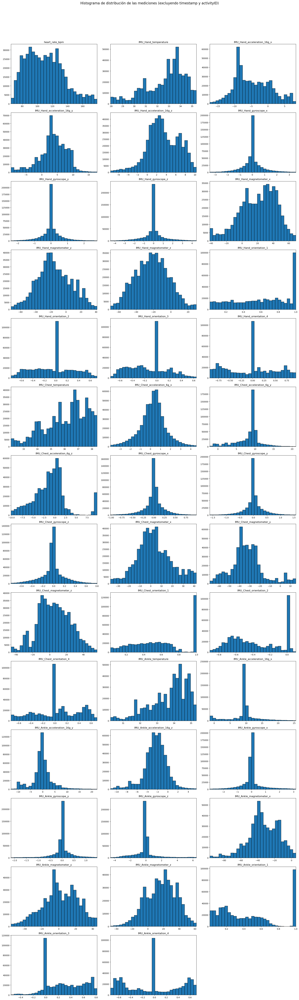

In [154]:
import numpy as np
import math
import matplotlib.pyplot as plt

# Lista de columnas que queremos excluir
excluded_cols = ['timestamp', 'activityID']

# Seleccionamos solo las columnas numéricas y excluimos 'timestamp' y 'activityID'
pamap_numeric = (
    cleaned_df
    .select_dtypes(include=['number'])
    .drop(columns=excluded_cols, errors='ignore')
)

# Obtenemos la lista de columnas numéricas restantes
columns = pamap_numeric.columns
num_attributes = len(columns)

# Definimos el layout: máximo 3 columnas por fila
cols = 3
rows = math.ceil(num_attributes / cols)

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
axes = axes.flatten()  # Para iterar fácilmente

for ax, col in zip(axes, columns):
    data = pamap_numeric[col].dropna()

    # Calculamos percentiles (por ejemplo, 1% y 99%)
    q1 = data.quantile(0.01)
    q99 = data.quantile(0.99)

    # Si el rango de valores en los percentiles es muy pequeño, evitamos errores
    if q1 == q99:
        ax.hist(data, bins=10, edgecolor='black')
        ax.set_title(col)
        ax.set_xlim([q1 - 1, q99 + 1])  # Ajuste mínimo para que no sea un rango vacío
        continue

    # Filtramos datos para el histograma (recortando outliers)
    data_filtered = data[(data >= q1) & (data <= q99)]

    # Generamos bins para ese rango filtrado
    bins = np.linspace(q1, q99, 30)

    # Graficamos solo los datos filtrados
    ax.hist(data_filtered, bins=bins, edgecolor='black')
    ax.set_title(col)

    # Ajustamos el límite de los ejes al rango filtrado
    ax.set_xlim([q1, q99])

# Si sobran ejes (subplots) porque hay menos columnas que subplots, los ocultamos
for ax in axes[num_attributes:]:
    ax.set_visible(False)

plt.suptitle("Histograma de distribución de las mediciones (excluyendo timestamp y activityID)", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


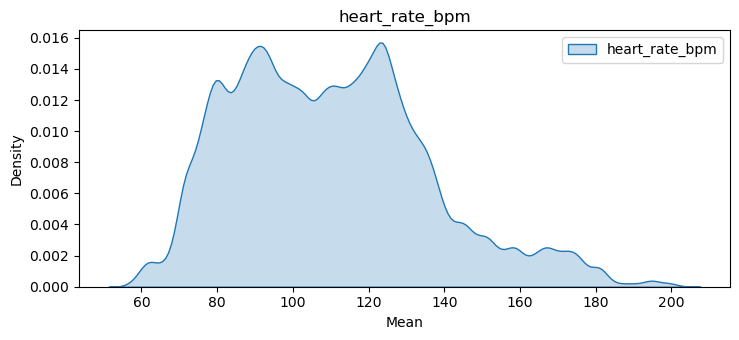

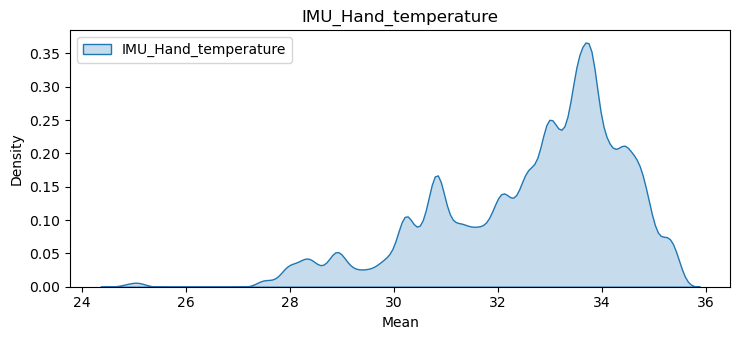

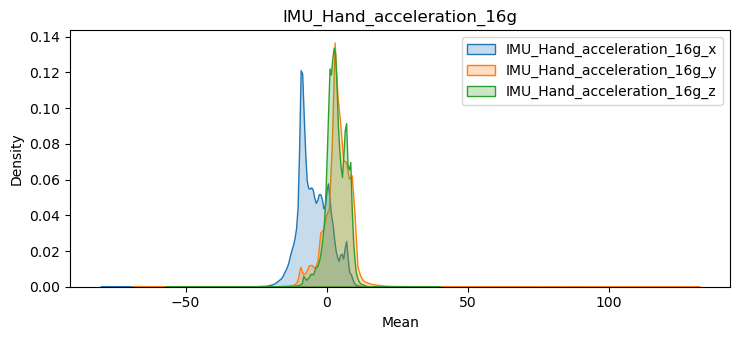

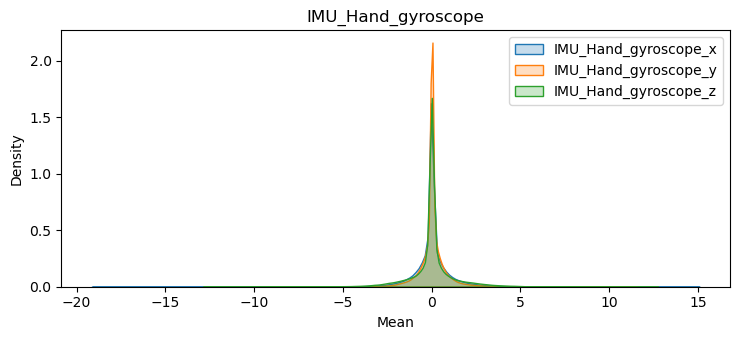

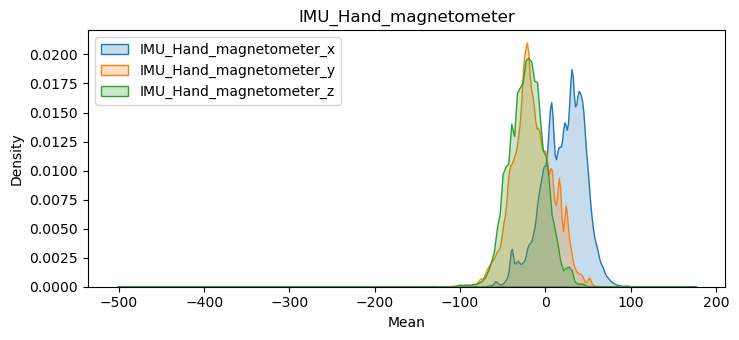

...

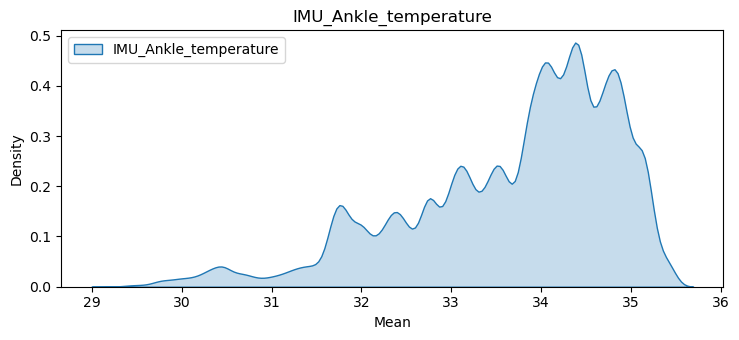

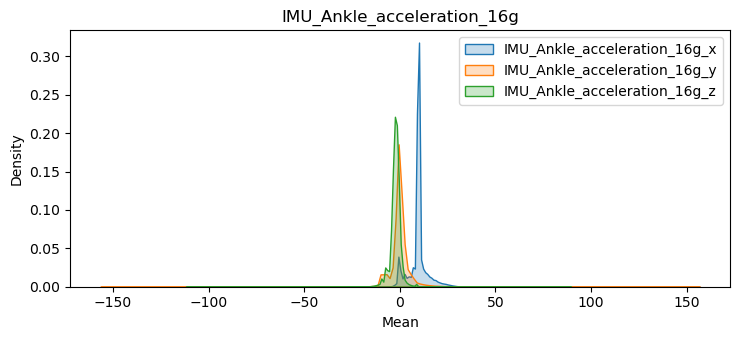

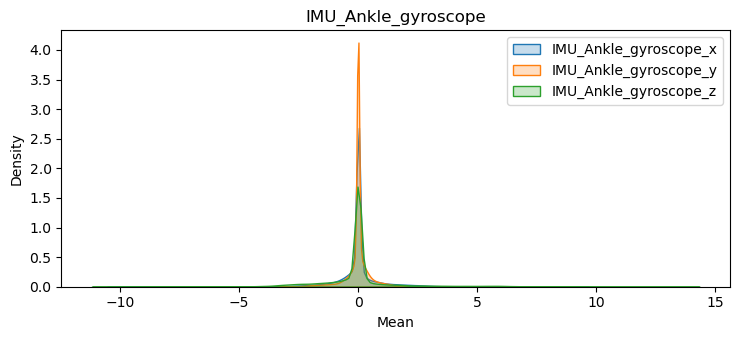

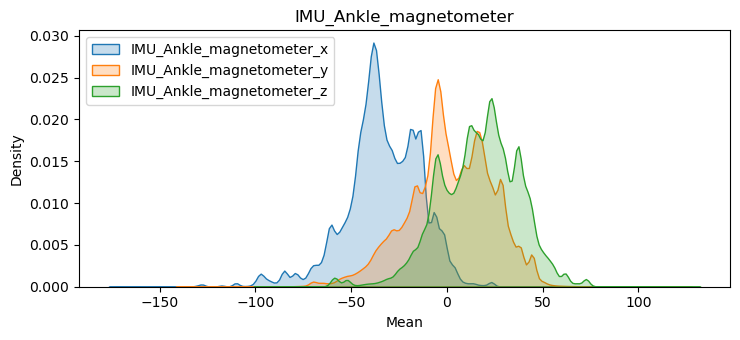

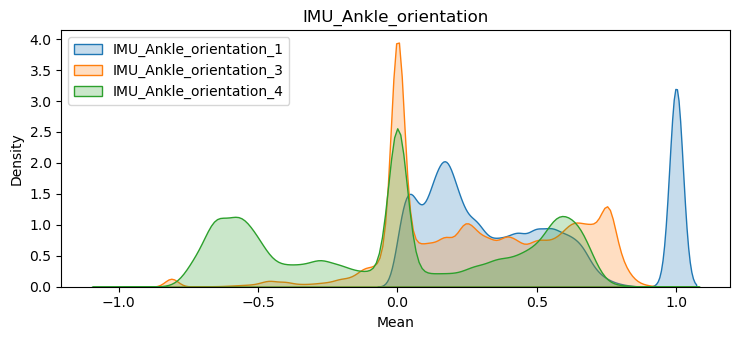

In [156]:
import seaborn as sns
import matplotlib.pyplot as plt

# Fuerza el estilo por defecto de Matplotlib
plt.style.use('default')

# Lista de columnas
columnas = [
    'heart_rate_bpm', 'IMU_Hand_temperature',
    'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
    'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
    'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
    'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
    'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
    'IMU_Chest_acceleration_6g_x', 'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z', 'IMU_Chest_gyroscope_x',
    'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
    'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
    'IMU_Chest_magnetometer_z', 'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2', 'IMU_Chest_orientation_4',
    'IMU_Ankle_temperature', 'IMU_Ankle_acceleration_16g_x',
    'IMU_Ankle_acceleration_16g_y', 'IMU_Ankle_acceleration_16g_z',
    'IMU_Ankle_gyroscope_x', 'IMU_Ankle_gyroscope_y',
    'IMU_Ankle_gyroscope_z', 'IMU_Ankle_magnetometer_x',
    'IMU_Ankle_magnetometer_y', 'IMU_Ankle_magnetometer_z',
    'IMU_Ankle_orientation_1', 'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4'
]
# Conjunto para llevar el control de las columnas ya graficadas
procesadas = set()

for col in columnas:
    # Si ya se procesó, pasamos a la siguiente
    if col in procesadas:
        continue

    # Si la columna contiene "orientation", se agrupan todas las orientaciones del sensor
    if "orientation" in col:
        # Se toma como base el nombre sin el número final, por ejemplo "IMU_Ankle_orientation"
        base = col.rsplit('_', 1)[0]
        # Se obtienen todas las columnas que empiezan con esa base
        group_cols = [c for c in columnas if c.startswith(base)]
        if group_cols:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in sorted(group_cols):
                sns.kdeplot(cleaned_df[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.tight_layout()  # Ajusta la figura para evitar cortes
            plt.show()
            procesadas.update(group_cols)
        continue

    # Caso de variables agrupables por eje: _x, _y, _z
    if col.endswith('_x'):
        base = col[:-2]  # Se quita el sufijo "_x"
        col_y = base + '_y'
        col_z = base + '_z'
        if col_y in columnas and col_z in columnas:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in [col, col_y, col_z]:
                sns.kdeplot(cleaned_df[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.tight_layout()
            plt.show()
            procesadas.update({col, col_y, col_z})
        else:
            plt.figure(figsize=(7.5, 3.5))
            sns.kdeplot(cleaned_df[col], fill=True, label=col)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(col)
            plt.legend()
            plt.tight_layout()
            plt.show()
            procesadas.add(col)

    elif col.endswith('_y') or col.endswith('_z'):
        # Si se llega aquí es porque no se encontró la agrupación x,y,z completa
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(cleaned_df[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.tight_layout()
        plt.show()
        procesadas.add(col)

    else:
        # Para el resto de columnas, se grafica individualmente
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(cleaned_df[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.tight_layout()
        plt.show()
        procesadas.add(col)


### 2.11.3. Estandarización y escalado

In [166]:
import warnings
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.preprocessing import PowerTransformer

# Opcional: si prefieres suprimir los warnings de overflow, descomenta la siguiente línea:
# warnings.filterwarnings("ignore", category=RuntimeWarning)

# Umbral de significancia para la prueba KS
alpha = 0.05

# Lista de columnas a evaluar y transformar
cols = [
    'heart_rate_bpm', 'IMU_Hand_temperature',
    'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
    'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
    'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
    'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
    'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
    'IMU_Chest_acceleration_6g_x', 'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z', 'IMU_Chest_gyroscope_x',
    'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
    'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
    'IMU_Chest_magnetometer_z', 'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2', 'IMU_Chest_orientation_4',
    'IMU_Ankle_temperature', 'IMU_Ankle_acceleration_16g_x',
    'IMU_Ankle_acceleration_16g_y', 'IMU_Ankle_acceleration_16g_z',
    'IMU_Ankle_gyroscope_x', 'IMU_Ankle_gyroscope_y',
    'IMU_Ankle_gyroscope_z', 'IMU_Ankle_magnetometer_x',
    'IMU_Ankle_magnetometer_y', 'IMU_Ankle_magnetometer_z',
    'IMU_Ankle_orientation_1', 'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4'
]

# Listas para almacenar los segmentos procesados y los resultados de las pruebas KS
processed_segments = []
results = []

# Se asume que "cleaned_df" es el DataFrame original y contiene las columnas "subject_id" y "timestamp"
for subject, group in cleaned_df.groupby('subject_id'):
    group = group.sort_values('timestamp').reset_index(drop=True)
    segments = [group.iloc[i:i+2000].copy() for i in range(0, len(group), 2000)]
    
    for segment in segments:
        for col in cols:
            if col not in segment.columns:
                continue
            
            # Extraer datos no nulos y darles forma 2D (requerido por PowerTransformer)
            data = segment[col].dropna().values.reshape(-1, 1)
            data_flat = data.flatten()
            
            # Si los valores son constantes, se omite la prueba de normalidad
            if np.std(data_flat) == 0:
                print(f"Subject {subject}, columna {col}: valores constantes. Se omite la prueba de normalidad.")
                continue
            
            # Clipping de los datos para mitigar valores extremos (usa percentil 1 y 99)
            lower_bound = np.percentile(data_flat, 1)
            upper_bound = np.percentile(data_flat, 99)
            data_clipped = np.clip(data, lower_bound, upper_bound)
            data_flat_clipped = data_clipped.flatten()
            
            # Prueba KS ANTES de la transformación sobre los datos recortados
            mu, sigma = np.mean(data_flat_clipped), np.std(data_flat_clipped)
            stat, p = stats.kstest(data_flat_clipped, 'norm', args=(mu, sigma))
            res = "Normal" if p >= alpha else "No Normal"
            results.append({
                "subject": subject,
                "columna": col,
                "fase": "Antes",
                "p_valor": p,
                "resultado": res
            })
            print(f"Subject {subject}, columna {col} -> p-valor ANTES de Yeo-Johnson: {p:.4f} ({res})")
            
            # Si no pasa la normalidad, aplicar la transformación Yeo-Johnson
            if p < alpha:
                pt = PowerTransformer(method='yeo-johnson', standardize=False)
                try:
                    transformed = pt.fit_transform(data_clipped)
                    trans_flat = transformed.flatten()
                    
                    # Actualizar los valores en el DataFrame para los índices correspondientes
                    segment.loc[segment[col].notnull(), col] = trans_flat
                    
                    # Prueba KS DESPUÉS de la transformación
                    new_mu, new_sigma = np.mean(trans_flat), np.std(trans_flat)
                    stat2, p2 = stats.kstest(trans_flat, 'norm', args=(new_mu, new_sigma))
                    res2 = "Normal" if p2 >= alpha else "No Normal"
                    results.append({
                        "subject": subject,
                        "columna": col,
                        "fase": "Después",
                        "p_valor": p2,
                        "resultado": res2
                    })
                    print(f"Subject {subject}, columna {col} -> p-valor DESPUÉS de Yeo-Johnson: {p2:.4f} ({res2})")
                except Exception as e:
                    print(f"Error en la transformación de la columna {col} para sujeto {subject}: {e}")
                    results.append({
                        "subject": subject,
                        "columna": col,
                        "fase": "Después",
                        "p_valor": None,
                        "resultado": f"Error: {e}"
                    })
            else:
                # Si la distribución ya era normal, se registra el mismo resultado para la fase "Después"
                results.append({
                    "subject": subject,
                    "columna": col,
                    "fase": "Después",
                    "p_valor": p,
                    "resultado": "Normal"
                })
        processed_segments.append(segment)

# Reconstruir el DataFrame completo procesado (si se desea continuar trabajando con él)
processed_df = pd.concat(processed_segments).reset_index(drop=True)

# Crear DataFrame con los resultados de las pruebas KS
results_df = pd.DataFrame(results)

# Generar dos tablas separadas: una para la fase "Antes" y otra para la fase "Después"
results_df_antes = results_df[results_df['fase'] == 'Antes'].sort_values(by=['subject', 'columna'])
results_df_despues = results_df[results_df['fase'] == 'Después'].sort_values(by=['subject', 'columna'])

# Mostrar los resultados
print("Resultados ANTES de la transformación:")
results_df_antes.to_string(index=False)

print("\nResultados DESPUÉS de la transformación:")
results_df_despues.to_string(index=False)


Subject subject101, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_z -> p

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject101, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0001 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0011 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0413 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0025 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0010 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_x -> p

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0312 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_y -> p-valor ANTES

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject101, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_orientation_1: v

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject101, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0032 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0147 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0046 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0017 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyro

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z 

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Chest_orientation_2

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Error en la transformación de la columna IMU_Hand_temperature para sujeto subject101: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject101, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0353 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.1431 (Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.1083 (Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.4746 (Normal)
Subject subject101, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.3007 (Normal)
Subject subject101, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0116 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johns

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0017 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0012 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0949 (Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyr

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject101, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_z -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Hand_orientation_2: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Hand_orientation_3: val

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0008 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0077 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.2371 (Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Chest_orientation_2: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Chest_orientation_4: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleratio

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_orientation_1: v

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Error en la transformación de la columna IMU_Chest_temperature para sujeto subject101: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject101, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0751 (Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0043 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0023 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0258 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor ANTES

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0997 (Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.3364 (Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0004 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0078 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Chest_orientation_2: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Chest_orientation_4: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_tempe

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_orientation_3: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_orientation_4: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_x -> p-valor ANTE

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject101, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0003 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0005 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Chest_orientation_2: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Chest_orientation_4: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceler

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_orientation_3: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_orientation_4: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_acceleration_16g_x -> p-valor D

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_orientation_3: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_orientation_4: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_temperature -> p-valor ANT

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0039 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0002 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0204 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_orientation_1: v

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject101, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0006 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0019 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IM

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2071: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


Subject subject101, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0001 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0001 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Hand_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Hand_orientation_2: valores 

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Ankle_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_orientation_3: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Ankle_orientation_4: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna heart_rate_bpm -> p-valor

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject101, columna IMU_Chest_orientation_1: valores constantes. Se omite la prueba de normalidad.
Subject subject101, columna IMU_Chest_orientation_2

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject101, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.4844 (Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0956 (Normal)
Subject subject101, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.3064 (Normal)
Subject subject101, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.2478 (Normal)
Subject subject101, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.9309 (Normal)
Subject subject101, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.3868 (Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0222 (No Normal)
Subject subject101, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.1252 (Normal)
Subject subject101, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.5854 (Normal)
Subject subject101, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0006 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.4152 (Normal)
Subject subject102, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.6055 (Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_1 -> p-valor

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0012 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0009 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.3422 (Normal)
Subject subject102, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.8574 (Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_z -> p-val

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Ankle_temperature para sujeto subject102: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject102, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_y -> p-valor ANT

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_1 ->

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0028 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0049 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0021 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0078 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de 

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_z -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject102, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_temperature -> p-valor A

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject102, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_1 -> p-valor A

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0019 (No Normal)
Subject subject102, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0017 (No Normal)
Subject subject102, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0018 (No Normal)
Subject subject102, columna IMU_Ankle_temperature -

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_1 ->

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject102, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Error en la transformación de la columna IMU_Ankle_temperature para sujeto subject102: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject102, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject102, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0012 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_1 ->

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_z -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject102, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_z -> p-valor ANTES 

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyro

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject102, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0174 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0103 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0001 (No Normal)
Subject subject102, columna IMU_Ankle_orientation

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0020 (No Normal)
Subject subject102, columna IMU_Hand_orientation_1 -> p-valor A

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0004 (No Normal)
Subject subject102, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Chest_orientation

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject102, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0387 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0959 (Normal)
Subject subject102, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-J

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject102, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0024 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0010 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.1499 (Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0003 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0002 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0003 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_magnetometer_x -

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_orientation_4 -> p-valo

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject102, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0001 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0001 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_gy

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject102, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Hand_temperature -> p-valor ANTES de Ye

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Error en la transformación de la columna IMU_Ankle_temperature para sujeto subject102: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject102, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject102, columna IMU_Ankle_gyroscope_x -

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject103, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_3 -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject103, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_x -> p-valo

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject103, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0317 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.1200 (Normal)
Subject subject103, columna IMU_A

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject103, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject103, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.1178 (Normal)
Subject subject103, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0018 (No Normal)
Subject subject103, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0010 (No Normal)
Subject subject103, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.2394 (Normal)
Subject subject103, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_magnetometer_z -> p-valor DES

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject103, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Che

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject103, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_orientation_1 ->

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject103, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscop

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject103, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Ankle_temperature para sujeto subject103: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject103, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_y -> p-valo

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject103, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_x 

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject103, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Che

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject103, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_orientation_1 ->

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject103, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_magnetometer_y -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject103, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0206 (No Normal)
Subject subject103, columna IMU_Ankle_acceleration_16g_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject104, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_2 -> p-val

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject104, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0076 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0277 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.1180 (Normal)
Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0012 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0227 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0194 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_1 -> p-valor ANTE

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor DES

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_3 -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject104, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_y -> p-valor D

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject104, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.7336 (Normal)
Subject subject104, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ank

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_y -> p-valor D

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Hand_temperature para sujeto subject104: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject104, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0013 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0006 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson

C:\Users\Personal\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2071: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


Subject subject104, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0008 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0004 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_orientation_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject104, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject104, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_z -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Chest_temperature para sujeto subject104: The algorithm terminated without finding a valid bracket. Consider trying differen

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject104, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_

C:\Users\Personal\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2071: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


Subject subject104, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_acceleration_16g_x 

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_z -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject104, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_acceleration_6g_x -> p-valo

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0024 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0022 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0018 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.4584 (Normal)
Subject subject104, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉ

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject104, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0014 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.6144 (Normal)
Subject subject104, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0039 (No Normal)
Subject subject104, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0021 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0001 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Chest_magnetometer_y -> p-valor DESP

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0014 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0004 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0007 (No Normal)
Subject subject104, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_gyro

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0002 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0002 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_z -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject104, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Hand_orientation_2 -> p-val

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject104, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject104, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna heart_rate_bpm -> p-valor DESPUÉS d

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_z -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject105, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_accelerati

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_y -> p-valor ANTES

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject105, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0439 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0243 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_y -> p-valor D

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_temperature -> p-valor ANTES de Ye

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject105, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_3 -> p-valor

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyro

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Hand_temperature para sujeto subject105: The algorithm terminated without finding a valid bracket. Consider trying different initial poi

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject105, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0093 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.1276 (Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0007 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0470 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0070 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0328 (No Normal)
Subject subject105, columna IMU_Chest_g

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.1089 (Normal)
Subject subject105, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0056 (No Normal)
Subject subject105, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0296 (No Normal)
Subject subject105, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_temperature -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation

C:\Users\Personal\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2071: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0002 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.1223 (Normal)
Subject subject105, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0032 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_4 ->

C:\Users\Personal\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2071: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


Subject subject105, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_1 ->

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de 

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de 

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Error en la transformación de la columna IMU_Ankle_temperature para sujeto subject105: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject105, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_x -

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0001 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0074 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0109 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_1 ->

C:\Users\Personal\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2071: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


Subject subject105, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0055 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0034 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_gyro

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject105, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0023 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0170 (No Normal)
Subject subject105, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0098 (No Normal)
Subject subject105, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0400 (No Normal)
Subject subject105, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_4 -> p-valo

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject105, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ank

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject105, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyro

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject105, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_orientation_4 

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject105, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IM

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_orientation_4 

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject105, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0052 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0063 (No Normal)
Subject subject105, columna IMU_Chest_acceleration_6g_y

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_orientation_2 -> p-val

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject105, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Hand_gyro

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject105, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject105, columna IMU_Ankle_magnetometer_x -> p

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject106, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_temperature -> p-valor A

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.7284 (Normal)
Subject subject106, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.4482 (Normal)
Subject subject106, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.4337 (Normal)
Subject subject106, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0003 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS d

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_2 -> p-val

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_x -> p-valo

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0121 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_orientation_

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Error en la transformación de la columna IMU_Chest_temperature para sujeto subject106: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject106, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_x -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0147 (No Normal)
Subject subject106, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_magnetometer_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Hand_temperature para sujeto subject106: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject106, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_magnetometer_z -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0027 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0054 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0067 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de 

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0274 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0353 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_orientation_1 ->

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0020 (No Normal)
Subject subject106, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_temperature -> p-valor A

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Error en la transformación de la columna IMU_Hand_temperature para sujeto subject106: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject106, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_x -> p-valor

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_temperature -> p-valor ANTES de Ye

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject106, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_magnetometer_y -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0084 (No Normal)
Subject subject106, columna IMU_Hand_orientation_1 -> p-valor A

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0048 (No Normal)
Subject subject106, columna IMU_Che

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject106, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Ankle_temperature para sujeto subject106: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject106, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Ankle_acceleration_16g_y -> p-valo

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject106, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0243 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0009 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0003 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_orientation_1 ->

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject106, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Chest_magnetometer_y -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject106, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject106, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0020 (No Normal)
Subject subject106, columna IMU_Hand_orientation_1 -> p-valor D

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject107, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject107, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject107, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gy

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject107, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject107, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gy

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject107, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gy

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject107, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna heart_rate_bpm -> p-valor DESPUÉS d

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject107, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject107, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gy

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Error en la transformación de la columna IMU_Chest_temperature para sujeto subject107: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject107, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0003 (No Normal)
Subject subject107, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_gyroscope_x -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_z -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject107, columna IMU_Ankle_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_orientation_4 

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject107, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_temperature -

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Error en la transformación de la columna IMU_Hand_temperature para sujeto subject107: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject107, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_gyroscope_x -> p-valor

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject107, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_accelerati

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject107, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Chest_temperature para sujeto subject107: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject107, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_z -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject107, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscop

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject107, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_4 -> p-valor D

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject107, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.3566 (Normal)
Subject subject107, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0523 (Normal)
Subject subject107, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0054 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0117 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0054 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0088 (No Normal)
Subject subject107, columna IMU_Ankle_gyroscope_z ->

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject107, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject107, columna IMU_Chest_acceleration_6

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject108, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valo

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.8906 (Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.6320 (Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.2797 (Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_y -> p-val

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject108, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.9294 (Normal)
Subject subject108, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.2338 (Normal)
Subject subject108, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.2635 (Normal)
Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_1 -> p-valor ANTE

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject108, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_x -> p-valo

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_y -> p-valor ANTES

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.4134 (Normal)
Subject subject108, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0834 (Normal)
Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_1 -> p-valor

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.8948 (Normal)
Subject subject108, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.9248 (Normal)
Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0009 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0002 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0002 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_z -> p-valo

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Hand_temperature para sujeto subject108: The algorithm terminated without finding a valid bracket. Consider trying different initial poi

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject108, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_y -> p-valor ANTES

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_x -> p-v

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0002 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-val

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject108, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.2359 (Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.1788 (Normal)
Subject subject108, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0013 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0001 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor D

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0001 (No Normal)
Subject subject108, columna IMU_Chest_orientation

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject108, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.1250 (Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0010 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_y -> p-valor ANTES

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Hand_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0050 (No Normal)
Subject subject108, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0376 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0001 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0047 (No Normal)
Subject subject108, columna IMU_Chest_temperature -> p-valor A

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject108, columna IMU_Chest_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ches

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject108, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_magnetometer_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2071: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


Subject subject108, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: nan (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleratio

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Error en la transformación de la columna IMU_Ankle_temperature para sujeto subject108: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject108, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_x -

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Chest_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_1 ->

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject108, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Ankle_temperature para sujeto subject108: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject108, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0132 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0003 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0032 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0119 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyro

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Error en la transformación de la columna IMU_Chest_temperature para sujeto subject108: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject108, columna IMU_Chest_acceleration_6g_x -> p-valor ANTES de Yeo-Johnson: 0.0007 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0169 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_acceleration_6g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0005 (No Normal)
Subject subject108, columna IMU_Chest_gyroscope_x -> p-va

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_z -> p-valor ANTES 

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject108, columna IMU_Ankle_magnetometer_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna heart_rate_bpm -> p-valor DESPUÉS d

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject108, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0016 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0048 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0064 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0172 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_magnetometer_

C:\Users\Personal\anaconda3\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2071: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


Subject subject108, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_gyroscope_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_magnetometer_y -> p-valor DESPUÉS de 

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Ankle_magnetometer_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_temperature -> p-valor ANTES de Ye

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Ankle_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Ankle_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna heart_rate_bpm -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna heart_rate_bpm -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Hand_temperature para sujeto subject108: The algorithm terminated without finding a valid bracket. Consider trying different initial points.
Subject subject108, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_x -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.00

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Hand_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_3 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Hand_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Error en la transformación de la columna IMU_Chest_temperature para sujeto subject108: The algorithm terminated without finding a valid bracket. Consider trying differen

C:\Users\Personal\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:3438: RuntimeWarning: overflow encountered in power
  out[pos] = (np.power(x[pos] + 1, lmbda) - 1) / lmbda


Subject subject108, columna IMU_Chest_orientation_1 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_1 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_2 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_2 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_4 -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Chest_orientation_4 -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_temperature -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject108, columna IMU_Ankle_acceleration_16g_

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Subject subject109, columna IMU_Hand_temperature -> p-valor DESPUÉS de Yeo-Johnson: 0.0000 (No Normal)
Subject subject109, columna IMU_Hand_acceleration_16g_x -> p-valor ANTES de Yeo-Johnson: 0.1051 (Normal)
Subject subject109, columna IMU_Hand_acceleration_16g_y -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject109, columna IMU_Hand_acceleration_16g_y -> p-valor DESPUÉS de Yeo-Johnson: 0.0030 (No Normal)
Subject subject109, columna IMU_Hand_acceleration_16g_z -> p-valor ANTES de Yeo-Johnson: 0.0000 (No Normal)
Subject subject109, columna IMU_Hand_acceleration_16g_z -> p-valor DESPUÉS de Yeo-Johnson: 0.0673 (Normal)
Subject subject109, columna IMU_Hand_gyroscope_x -> p-valor ANTES de Yeo-Johnson: 0.1186 (Normal)
Subject subject109, columna IMU_Hand_gyroscope_y -> p-valor ANTES de Yeo-Johnson: 0.0003 (No Normal)
Subject subject109, columna IMU_Hand_gyroscope_y -> p-valor DESPUÉS de Yeo-Johnson: 0.4469 (Normal)
Subject subject109, columna IMU_Hand_gyroscope_z -> p-valor 

C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\Personal\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Resultados ANTES de la transformación:

Resultados DESPUÉS de la transformación:


'   subject                      columna    fase  p_valor                                                                                                  resultado\nsubject101 IMU_Ankle_acceleration_16g_x Después    0.000                                                                                                  No Normal\nsubject101 IMU_Ankle_acceleration_16g_x Después    0.000                                                                                                  No Normal\nsubject101 IMU_Ankle_acceleration_16g_x Después    0.000                                                                                                  No Normal\nsubject101 IMU_Ankle_acceleration_16g_x Después    0.000                                                                                                  No Normal\nsubject101 IMU_Ankle_acceleration_16g_x Después    0.000                                                                                                  No Normal\nsubject10

In [176]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MaxAbsScaler

# Supongamos que cleaned_df es el DataFrame original
# cleaned_df = ...

# Lista de columnas a transformar
cols = [
    'heart_rate_bpm', 'IMU_Hand_temperature',
    'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
    'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
    'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
    'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
    'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
    'IMU_Chest_acceleration_6g_x', 'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z', 'IMU_Chest_gyroscope_x',
    'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
    'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
    'IMU_Chest_magnetometer_z', 'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2', 'IMU_Chest_orientation_4',
    'IMU_Ankle_temperature', 'IMU_Ankle_acceleration_16g_x',
    'IMU_Ankle_acceleration_16g_y', 'IMU_Ankle_acceleration_16g_z',
    'IMU_Ankle_gyroscope_x', 'IMU_Ankle_gyroscope_y',
    'IMU_Ankle_gyroscope_z', 'IMU_Ankle_magnetometer_x',
    'IMU_Ankle_magnetometer_y', 'IMU_Ankle_magnetometer_z',
    'IMU_Ankle_orientation_1', 'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4'
]

# Función para calcular EMA (Exponential Moving Average)
def calculate_ema(series, k):
    alpha = 2 / (k + 1)
    ema = series.ewm(alpha=alpha, adjust=False).mean()
    return ema

# Función para Adaptive Normalization corregida
def adaptive_normalization(segment, col, k=5, omega=2000):
    """Aplica Adaptive Normalization a una columna en un segmento."""
    S = segment[col].dropna().values
    if len(S) < k:
        return segment[col].values  # No se puede calcular EMA si la serie es muy corta
    
    # Paso 1: Calcular EMA
    S_k = calculate_ema(pd.Series(S), k).values
    
    # Paso 2: Crear secuencia R
    R = []
    epsilon = 1e-10  # Valor pequeño para evitar división por cero
    num_windows = len(S) - omega + 1
    if num_windows <= 0:
        # Si no hay suficientes datos para formar una ventana, retornar ceros
        return np.zeros(len(segment))
    
    for i in range(num_windows):
        window_S = S[i:i+omega]
        window_R = window_S / (S_k[i] + epsilon)  # División segura
        R.extend(window_R)
    R = np.array(R)
    
    # Paso 3: Eliminación de outliers usando Box plots
    Q1 = np.percentile(R, 25)
    Q3 = np.percentile(R, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    R_clipped = np.clip(R, lower_bound, upper_bound)
    
    # Paso 4: Normalización min-max a [-1, 1]
    min_R = np.min(R_clipped)
    max_R = np.max(R_clipped)
    if min_R == max_R:
        return np.zeros_like(R_clipped)  # Evitar división por cero
    R_normalized = 2 * (R_clipped - min_R) / (max_R - min_R) - 1
    
    # Ajustar al tamaño original del segmento
    return np.pad(R_normalized, (0, len(segment) - len(R_normalized)), 'constant', constant_values=np.nan)

# Función para procesar los segmentos con una técnica específica
def process_segments(cleaned_df, technique):
    """Procesa el DataFrame por segmentos de 2000 registros aplicando la técnica especificada."""
    processed_segments = []
    for subject, group in cleaned_df.groupby('subject_id'):
        group = group.sort_values('timestamp').reset_index(drop=True)
        segments = [group.iloc[i:i+2000].copy() for i in range(0, len(group), 2000)]
        
        for segment in segments:
            for col in cols:
                if col not in segment.columns:
                    continue
                data = segment[col].dropna().values
                if len(data) == 0:
                    continue
                
                if technique == 'zscore':
                    # Z-score: media 0 y desviación estándar 1
                    if np.std(data) != 0:
                        scaler = StandardScaler()
                        transformed = scaler.fit_transform(data.reshape(-1, 1)).flatten()
                    else:
                        transformed = np.zeros_like(data)  # Manejo de valores constantes
                elif technique == 'maxabs':
                    # Maximum Absolute Scaling: escala al rango [-1, 1]
                    max_abs = np.max(np.abs(data))
                    if max_abs != 0:
                        transformed = data / max_abs
                    else:
                        transformed = np.zeros_like(data)  # Manejo de valores constantes
                elif technique == 'adaptive':
                    # Adaptive Normalization
                    transformed = adaptive_normalization(segment, col)
                else:
                    raise ValueError(f"Técnica no reconocida: {technique}")
                
                # Actualizar el segmento con los valores transformados
                segment.loc[segment[col].notnull(), col] = transformed
            processed_segments.append(segment)
    
    # Reconstruir el DataFrame completo procesado
    return pd.concat(processed_segments).reset_index(drop=True)

# Generar los tres datasets
df_zscore = process_segments(cleaned_df, 'zscore')
df_maxabs = process_segments(cleaned_df, 'maxabs')
df_adaptive = process_segments(cleaned_df, 'adaptive')

# Opcional: Guardar los datasets en archivos CSV
# df_zscore.to_csv('df_zscore.csv', index=False)
# df_maxabs.to_csv('df_maxabs.csv', index=False)
# df_adaptive.to_csv('df_adaptive.csv', index=False)

# Mostrar un mensaje de confirmación
print("Datasets generados:")
print("- df_zscore: Transformado con Z-score")
print("- df_maxabs: Transformado con Maximum Absolute Scaling")
print("- df_adaptive: Transformado con Adaptive Normalization")

Datasets generados:
- df_zscore: Transformado con Z-score
- df_maxabs: Transformado con Maximum Absolute Scaling
- df_adaptive: Transformado con Adaptive Normalization


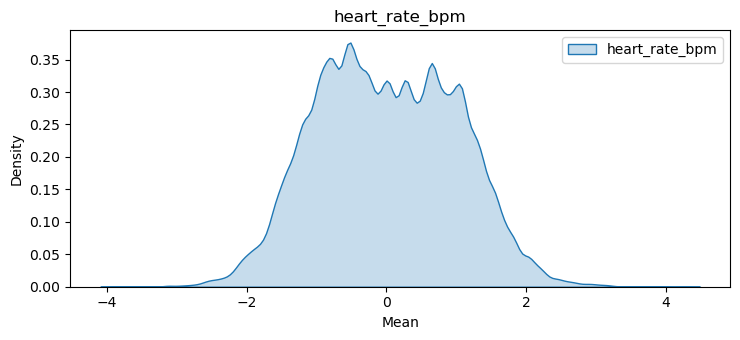

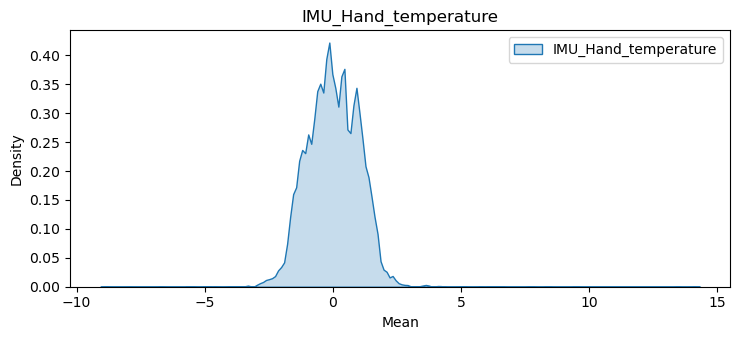

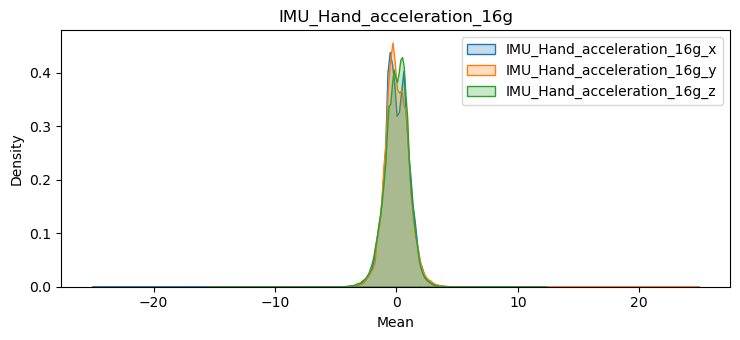

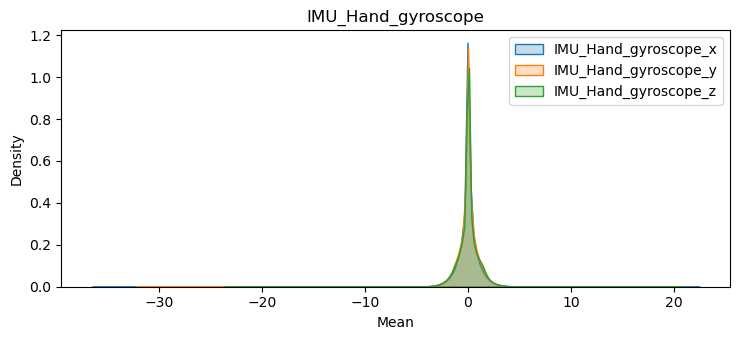

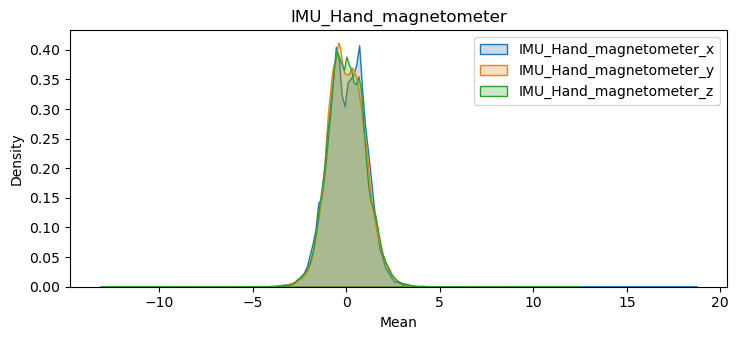

...

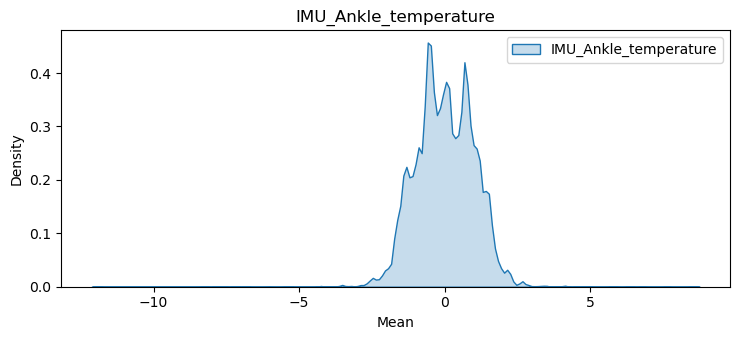

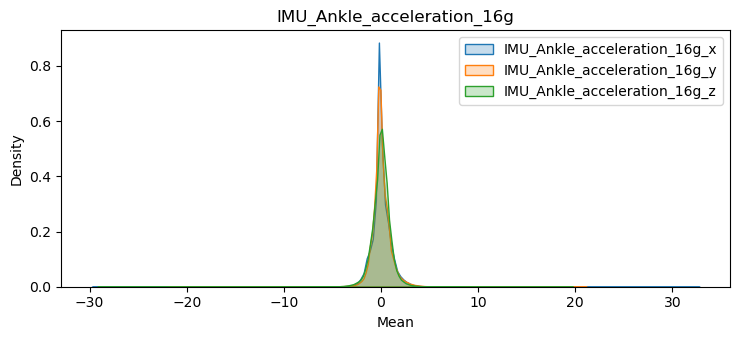

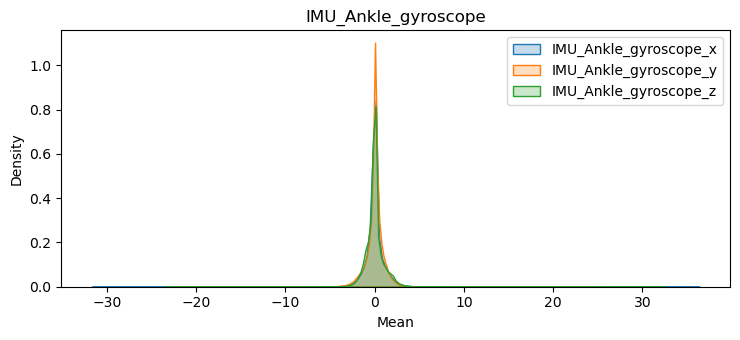

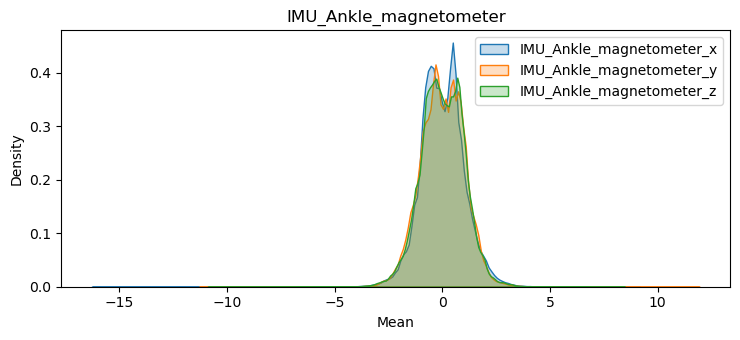

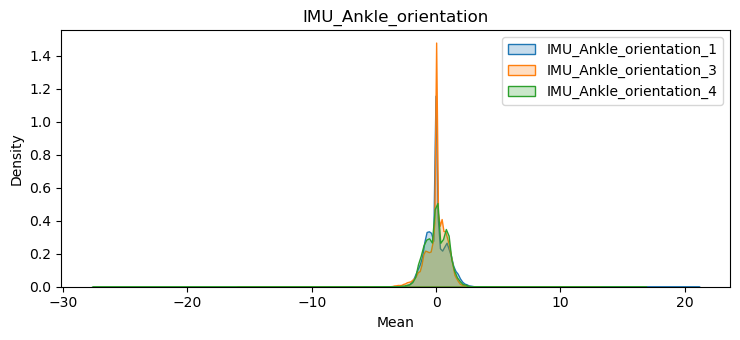

In [178]:
import seaborn as sns
import matplotlib.pyplot as plt

# Fuerza el estilo por defecto de Matplotlib
plt.style.use('default')

# Lista de columnas
columnas = [
    'heart_rate_bpm', 'IMU_Hand_temperature',
    'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
    'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
    'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
    'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
    'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
    'IMU_Chest_acceleration_6g_x', 'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z', 'IMU_Chest_gyroscope_x',
    'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
    'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
    'IMU_Chest_magnetometer_z', 'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2', 'IMU_Chest_orientation_4',
    'IMU_Ankle_temperature', 'IMU_Ankle_acceleration_16g_x',
    'IMU_Ankle_acceleration_16g_y', 'IMU_Ankle_acceleration_16g_z',
    'IMU_Ankle_gyroscope_x', 'IMU_Ankle_gyroscope_y',
    'IMU_Ankle_gyroscope_z', 'IMU_Ankle_magnetometer_x',
    'IMU_Ankle_magnetometer_y', 'IMU_Ankle_magnetometer_z',
    'IMU_Ankle_orientation_1', 'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4'
]
# Conjunto para llevar el control de las columnas ya graficadas
procesadas = set()

for col in columnas:
    # Si ya se procesó, pasamos a la siguiente
    if col in procesadas:
        continue

    # Si la columna contiene "orientation", se agrupan todas las orientaciones del sensor
    if "orientation" in col:
        # Se toma como base el nombre sin el número final, por ejemplo "IMU_Ankle_orientation"
        base = col.rsplit('_', 1)[0]
        # Se obtienen todas las columnas que empiezan con esa base
        group_cols = [c for c in columnas if c.startswith(base)]
        if group_cols:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in sorted(group_cols):
                sns.kdeplot(df_zscore[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.tight_layout()  # Ajusta la figura para evitar cortes
            plt.show()
            procesadas.update(group_cols)
        continue

    # Caso de variables agrupables por eje: _x, _y, _z
    if col.endswith('_x'):
        base = col[:-2]  # Se quita el sufijo "_x"
        col_y = base + '_y'
        col_z = base + '_z'
        if col_y in columnas and col_z in columnas:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in [col, col_y, col_z]:
                sns.kdeplot(df_zscore[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.tight_layout()
            plt.show()
            procesadas.update({col, col_y, col_z})
        else:
            plt.figure(figsize=(7.5, 3.5))
            sns.kdeplot(df_zscore[col], fill=True, label=col)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(col)
            plt.legend()
            plt.tight_layout()
            plt.show()
            procesadas.add(col)

    elif col.endswith('_y') or col.endswith('_z'):
        # Si se llega aquí es porque no se encontró la agrupación x,y,z completa
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(df_zscore[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.tight_layout()
        plt.show()
        procesadas.add(col)

    else:
        # Para el resto de columnas, se grafica individualmente
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(df_zscore[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.tight_layout()
        plt.show()
        procesadas.add(col)


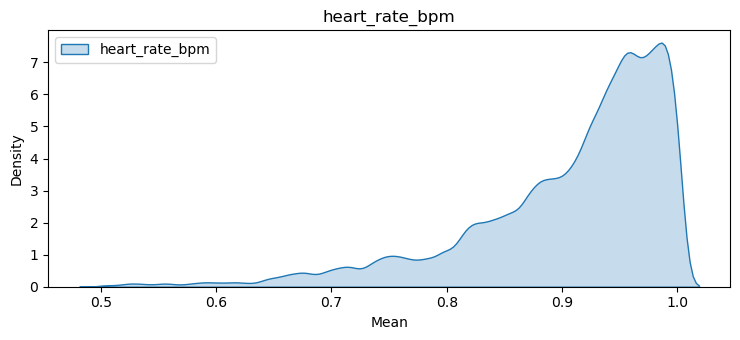

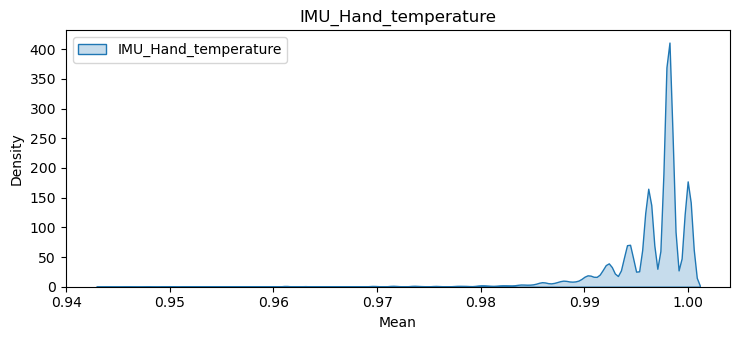

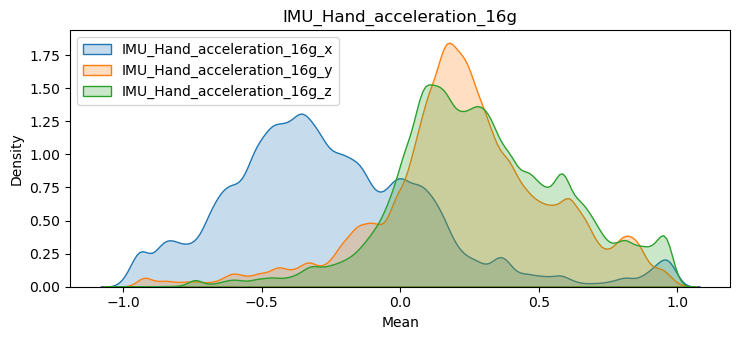

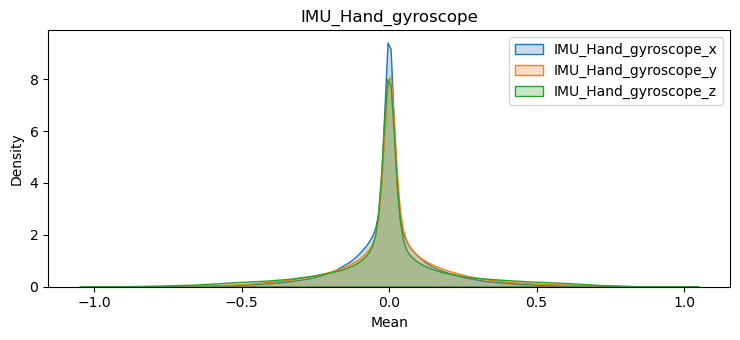

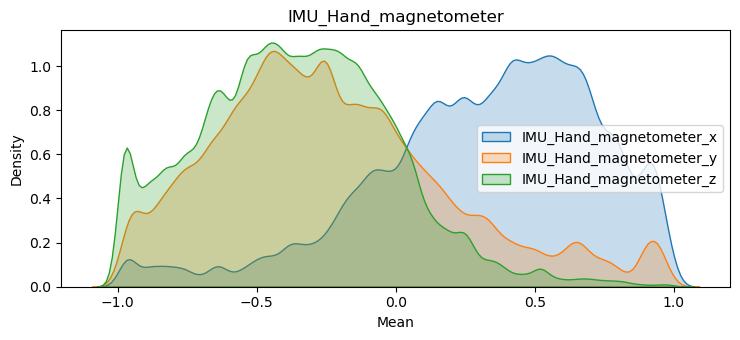

...

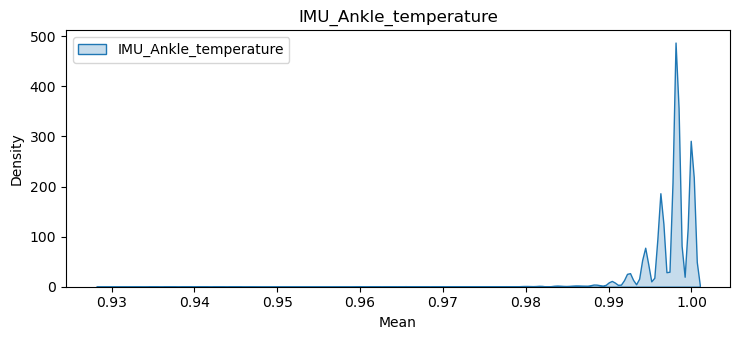

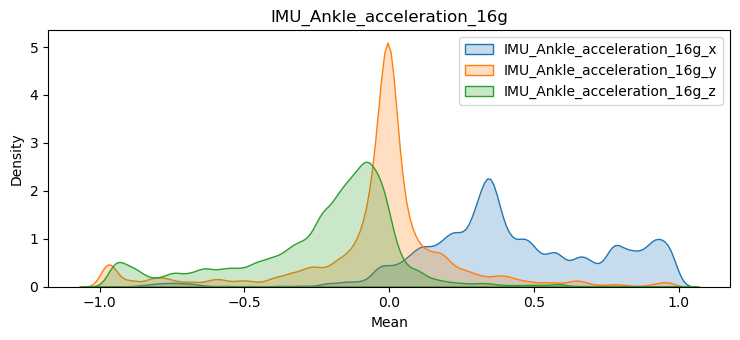

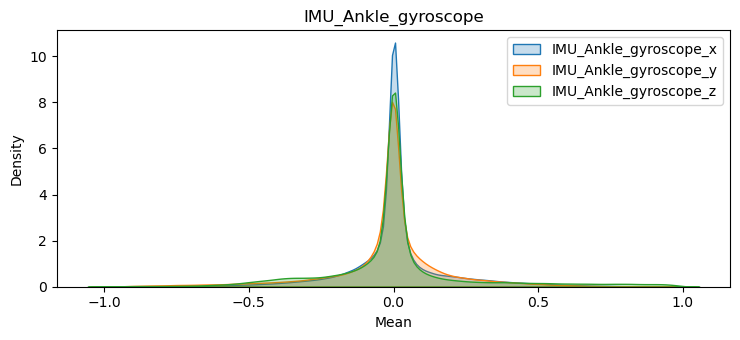

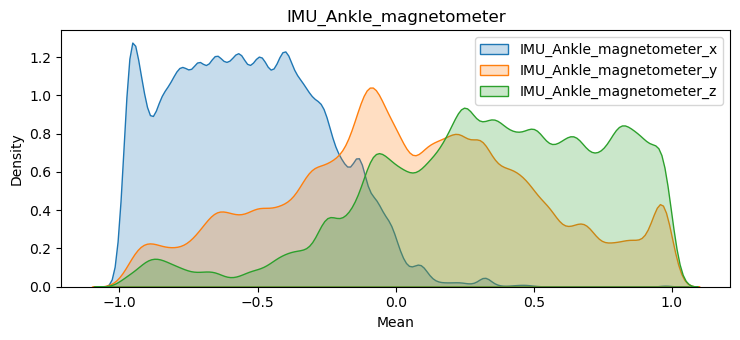

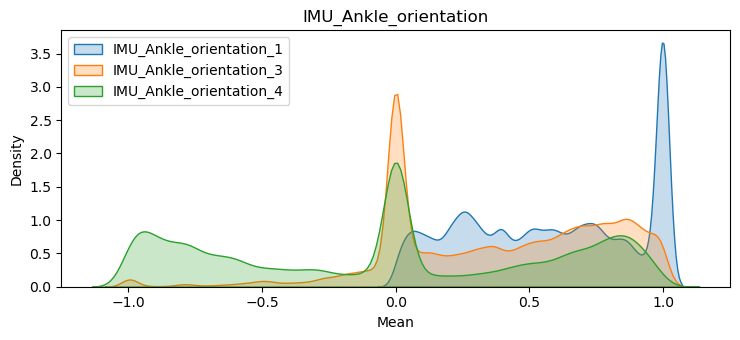

In [179]:
import seaborn as sns
import matplotlib.pyplot as plt

# Fuerza el estilo por defecto de Matplotlib
plt.style.use('default')

# Lista de columnas
columnas = [
    'heart_rate_bpm', 'IMU_Hand_temperature',
    'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
    'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
    'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
    'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
    'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
    'IMU_Chest_acceleration_6g_x', 'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z', 'IMU_Chest_gyroscope_x',
    'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
    'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
    'IMU_Chest_magnetometer_z', 'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2', 'IMU_Chest_orientation_4',
    'IMU_Ankle_temperature', 'IMU_Ankle_acceleration_16g_x',
    'IMU_Ankle_acceleration_16g_y', 'IMU_Ankle_acceleration_16g_z',
    'IMU_Ankle_gyroscope_x', 'IMU_Ankle_gyroscope_y',
    'IMU_Ankle_gyroscope_z', 'IMU_Ankle_magnetometer_x',
    'IMU_Ankle_magnetometer_y', 'IMU_Ankle_magnetometer_z',
    'IMU_Ankle_orientation_1', 'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4'
]
# Conjunto para llevar el control de las columnas ya graficadas
procesadas = set()

for col in columnas:
    # Si ya se procesó, pasamos a la siguiente
    if col in procesadas:
        continue

    # Si la columna contiene "orientation", se agrupan todas las orientaciones del sensor
    if "orientation" in col:
        # Se toma como base el nombre sin el número final, por ejemplo "IMU_Ankle_orientation"
        base = col.rsplit('_', 1)[0]
        # Se obtienen todas las columnas que empiezan con esa base
        group_cols = [c for c in columnas if c.startswith(base)]
        if group_cols:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in sorted(group_cols):
                sns.kdeplot(df_maxabs[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.tight_layout()  # Ajusta la figura para evitar cortes
            plt.show()
            procesadas.update(group_cols)
        continue

    # Caso de variables agrupables por eje: _x, _y, _z
    if col.endswith('_x'):
        base = col[:-2]  # Se quita el sufijo "_x"
        col_y = base + '_y'
        col_z = base + '_z'
        if col_y in columnas and col_z in columnas:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in [col, col_y, col_z]:
                sns.kdeplot(df_maxabs[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.tight_layout()
            plt.show()
            procesadas.update({col, col_y, col_z})
        else:
            plt.figure(figsize=(7.5, 3.5))
            sns.kdeplot(df_maxabs[col], fill=True, label=col)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(col)
            plt.legend()
            plt.tight_layout()
            plt.show()
            procesadas.add(col)

    elif col.endswith('_y') or col.endswith('_z'):
        # Si se llega aquí es porque no se encontró la agrupación x,y,z completa
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(df_maxabs[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.tight_layout()
        plt.show()
        procesadas.add(col)

    else:
        # Para el resto de columnas, se grafica individualmente
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(df_maxabs[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.tight_layout()
        plt.show()
        procesadas.add(col)


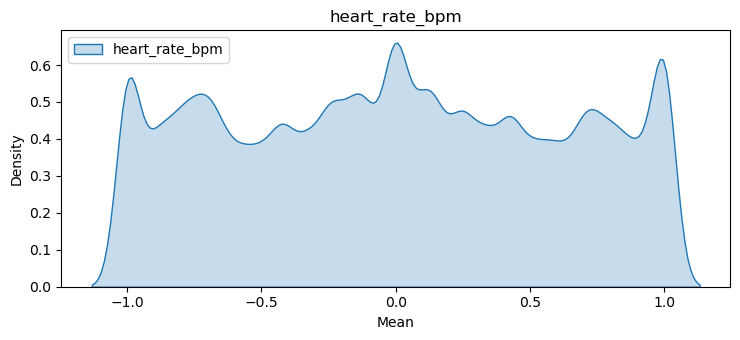

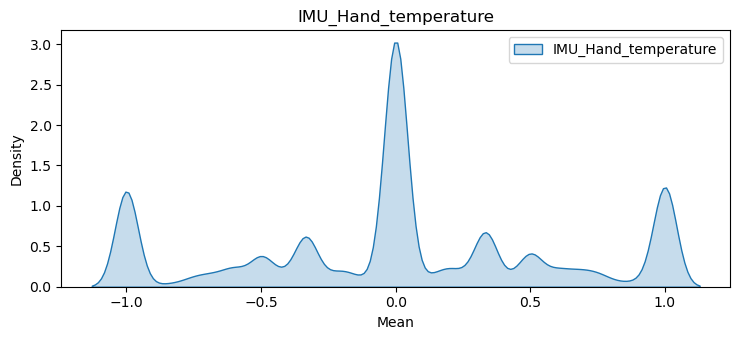

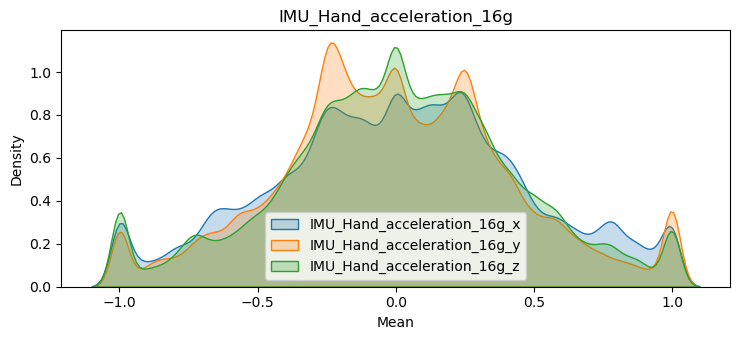

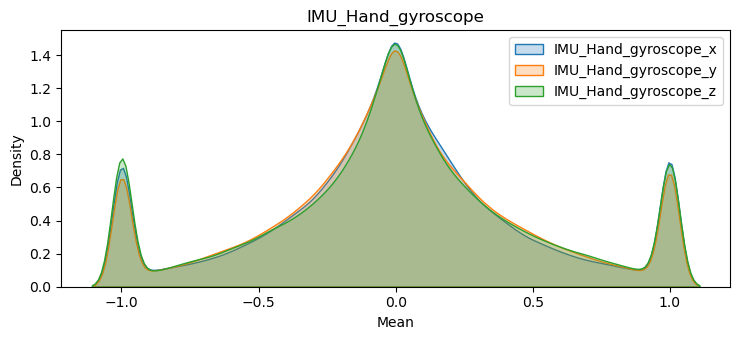

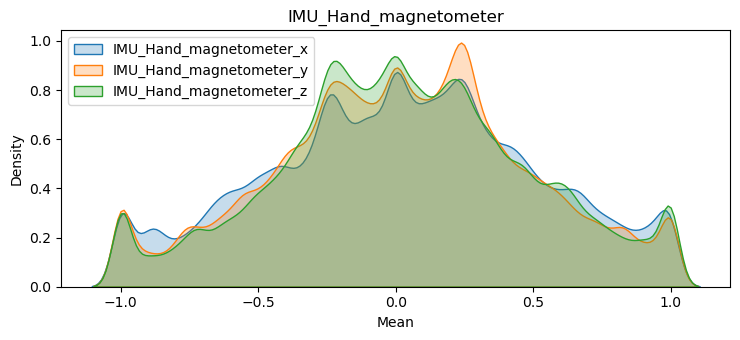

...

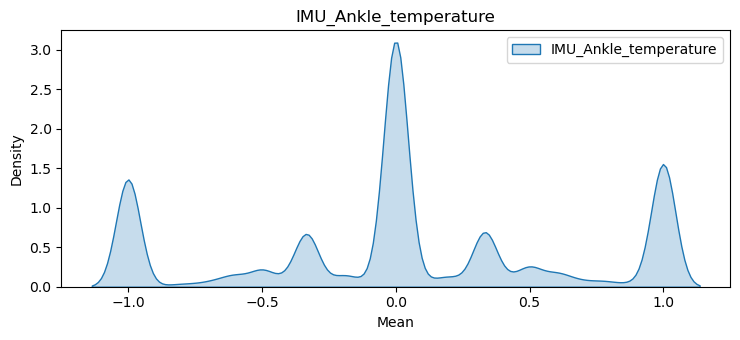

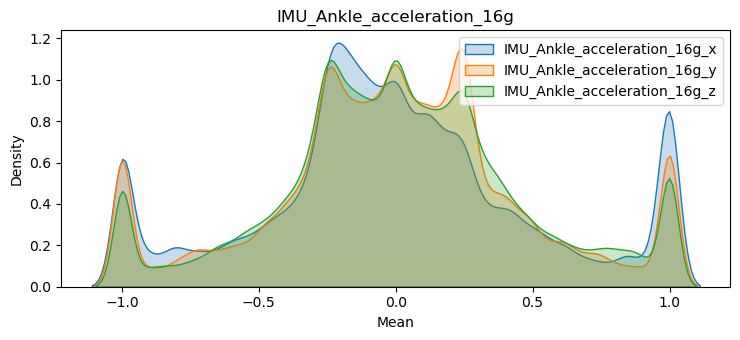

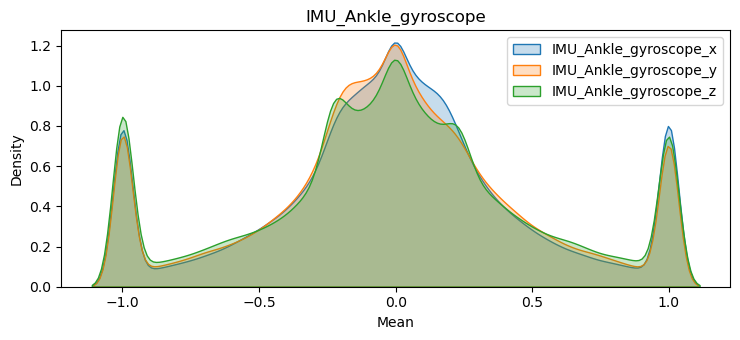

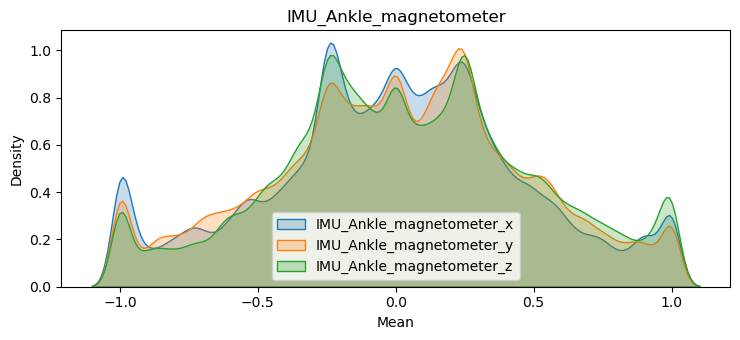

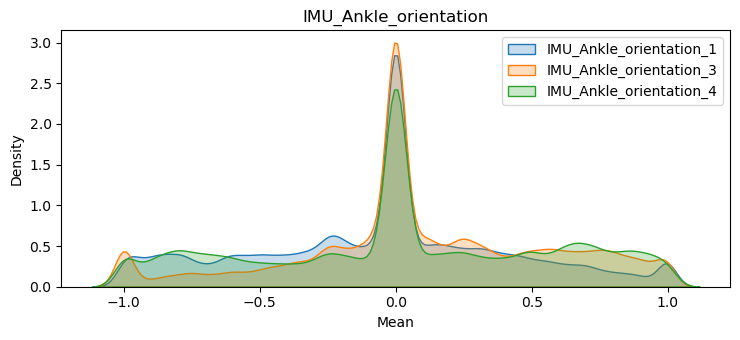

In [180]:
import seaborn as sns
import matplotlib.pyplot as plt

# Fuerza el estilo por defecto de Matplotlib
plt.style.use('default')

# Lista de columnas
columnas = [
    'heart_rate_bpm', 'IMU_Hand_temperature',
    'IMU_Hand_acceleration_16g_x', 'IMU_Hand_acceleration_16g_y',
    'IMU_Hand_acceleration_16g_z', 'IMU_Hand_gyroscope_x',
    'IMU_Hand_gyroscope_y', 'IMU_Hand_gyroscope_z',
    'IMU_Hand_magnetometer_x', 'IMU_Hand_magnetometer_y',
    'IMU_Hand_magnetometer_z', 'IMU_Hand_orientation_1',
    'IMU_Hand_orientation_2', 'IMU_Hand_orientation_3',
    'IMU_Hand_orientation_4', 'IMU_Chest_temperature',
    'IMU_Chest_acceleration_6g_x', 'IMU_Chest_acceleration_6g_y',
    'IMU_Chest_acceleration_6g_z', 'IMU_Chest_gyroscope_x',
    'IMU_Chest_gyroscope_y', 'IMU_Chest_gyroscope_z',
    'IMU_Chest_magnetometer_x', 'IMU_Chest_magnetometer_y',
    'IMU_Chest_magnetometer_z', 'IMU_Chest_orientation_1',
    'IMU_Chest_orientation_2', 'IMU_Chest_orientation_4',
    'IMU_Ankle_temperature', 'IMU_Ankle_acceleration_16g_x',
    'IMU_Ankle_acceleration_16g_y', 'IMU_Ankle_acceleration_16g_z',
    'IMU_Ankle_gyroscope_x', 'IMU_Ankle_gyroscope_y',
    'IMU_Ankle_gyroscope_z', 'IMU_Ankle_magnetometer_x',
    'IMU_Ankle_magnetometer_y', 'IMU_Ankle_magnetometer_z',
    'IMU_Ankle_orientation_1', 'IMU_Ankle_orientation_3',
    'IMU_Ankle_orientation_4'
]
# Conjunto para llevar el control de las columnas ya graficadas
procesadas = set()

for col in columnas:
    # Si ya se procesó, pasamos a la siguiente
    if col in procesadas:
        continue

    # Si la columna contiene "orientation", se agrupan todas las orientaciones del sensor
    if "orientation" in col:
        # Se toma como base el nombre sin el número final, por ejemplo "IMU_Ankle_orientation"
        base = col.rsplit('_', 1)[0]
        # Se obtienen todas las columnas que empiezan con esa base
        group_cols = [c for c in columnas if c.startswith(base)]
        if group_cols:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in sorted(group_cols):
                sns.kdeplot(df_adaptive[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.tight_layout()  # Ajusta la figura para evitar cortes
            plt.show()
            procesadas.update(group_cols)
        continue

    # Caso de variables agrupables por eje: _x, _y, _z
    if col.endswith('_x'):
        base = col[:-2]  # Se quita el sufijo "_x"
        col_y = base + '_y'
        col_z = base + '_z'
        if col_y in columnas and col_z in columnas:
            plt.figure(figsize=(7.5, 3.5))
            for sensor in [col, col_y, col_z]:
                sns.kdeplot(df_adaptive[sensor], fill=True, label=sensor)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(base)
            plt.legend()
            plt.tight_layout()
            plt.show()
            procesadas.update({col, col_y, col_z})
        else:
            plt.figure(figsize=(7.5, 3.5))
            sns.kdeplot(df_adaptive[col], fill=True, label=col)
            plt.xlabel('Mean')
            plt.ylabel('Density')
            plt.title(col)
            plt.legend()
            plt.tight_layout()
            plt.show()
            procesadas.add(col)

    elif col.endswith('_y') or col.endswith('_z'):
        # Si se llega aquí es porque no se encontró la agrupación x,y,z completa
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(df_adaptive[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.tight_layout()
        plt.show()
        procesadas.add(col)

    else:
        # Para el resto de columnas, se grafica individualmente
        plt.figure(figsize=(7.5, 3.5))
        sns.kdeplot(df_adaptive[col], fill=True, label=col)
        plt.xlabel('Mean')
        plt.ylabel('Density')
        plt.title(col)
        plt.legend()
        plt.tight_layout()
        plt.show()
        procesadas.add(col)
